In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import pandas as pd
from skimage.transform import resize
import random
import cv2
import glob

os.makedirs('final_images', exist_ok=True)

In [363]:
aruco_dict = cv2.aruco.getPredefinedDictionary(cv2.aruco.DICT_4X4_50)
aruco_params = cv2.aruco.DetectorParameters()
detector = cv2.aruco.ArucoDetector(aruco_dict, aruco_params)
tag_size = 0.02

objp = np.array([
    [0, 0, 0],
    [tag_size, 0, 0],
    [tag_size, tag_size, 0],
    [0, tag_size, 0]
], dtype=np.float32)

all_obj_points = []
all_img_points = []
image_size = None
image_paths = sorted(glob.glob('images/*.jpeg'))

det_count = 0

for img_path in image_paths:
    img = cv2.imread(img_path)
    if img is None:
        continue
    
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    if image_size is None:
        image_size = gray.shape[::-1]
    
    corners, ids, rejected = detector.detectMarkers(gray)
    
    if ids is not None and len(ids) > 0:
        det_count += 1
        for i, corner in enumerate(corners):
            corner_points = corner.reshape(4, 2).astype(np.float32)
            all_obj_points.append(objp)
            all_img_points.append(corner_points)

if len(all_obj_points) < 10:
    pass
else:
    ret, camera_matrix, dist_coeffs, rvecs, tvecs = cv2.calibrateCamera(
        all_obj_points, 
        all_img_points, 
        image_size, 
        None, 
        None
    )


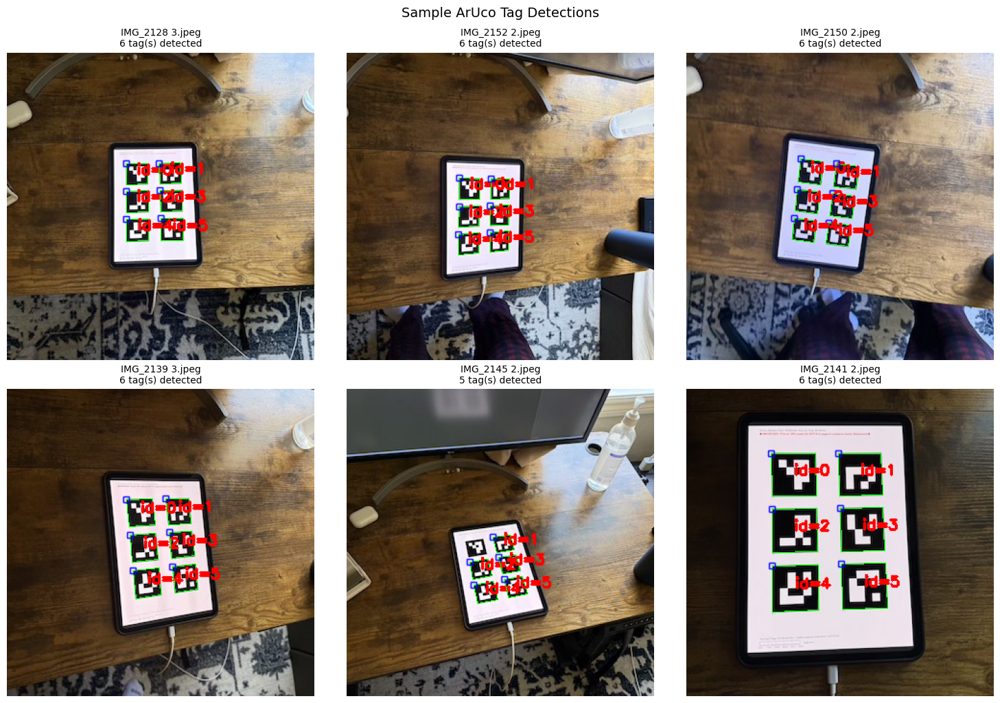

In [417]:
sample_images = random.sample(image_paths, min(6, len(image_paths)))
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
axes = axes.flatten()

for idx, img_path in enumerate(sample_images):
    img = cv2.imread(img_path)
    if img is None:
        axes[idx].text(0.5, 0.5, f'Failed to load:\n{os.path.basename(img_path)}', ha='center', va='center', transform=axes[idx].transAxes)
        axes[idx].axis('off')
        continue

    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    corners, ids, rejected = detector.detectMarkers(gray)

    if ids is not None:
        img_with_markers = cv2.aruco.drawDetectedMarkers(img_rgb.copy(), corners, ids)
        axes[idx].imshow(img_with_markers)
        axes[idx].set_title(f"{os.path.basename(img_path)}\n{len(ids)} tag(s) detected", fontsize=10)
    else:
        axes[idx].imshow(img_rgb)
        axes[idx].set_title(f"{os.path.basename(img_path)}\nNo tags detected", fontsize=10)
        
    axes[idx].axis('off')
plt.tight_layout()
plt.suptitle("Sample ArUco Tag Detections", fontsize=14, y=1.02)
plt.savefig('final_images/00_aruco_tag_detections.png', dpi=150, bbox_inches='tight')
plt.show()


In [324]:
if len(all_obj_points) >= 10:
    np.savez('camera_calibration.npz',
             camera_matrix=camera_matrix,
             dist_coeffs=dist_coeffs,
             rvecs=rvecs,
             tvecs=tvecs,
             reprojection_error=ret,
             image_size=image_size)


# Part 0.3: Camera Pose Estimation

Using the calibrated camera parameters to estimate camera pose for each image of the object.


In [ ]:
calib_data = np.load('camera_calibration.npz')
camera_matrix = calib_data['camera_matrix']
dist_coeffs = calib_data['dist_coeffs']
image_size_calib = calib_data['image_size']

print("Loaded calibration data:")
print(f"Camera Matrix:\n{camera_matrix}")
print(f"Distortion Coefficients:{dist_coeffs}")
print(f"Image Size: {image_size_calib}")

tag_size = 0.02  # meters
object_points = np.array([
    [0, 0, 0],
    [tag_size, 0, 0],
    [tag_size, tag_size, 0],
    [0, tag_size, 0]
], dtype=np.float32)


Loaded calibration data:
Camera Matrix:
[[297.07453524   0.         172.57369146]
 [  0.         297.95081783 162.86621931]
 [  0.           0.           1.        ]]
Distortion Coefficients:[[ 0.12091164  0.08763079  0.00283891  0.01594372 -1.17369185]]
Image Size: [320 320]


In [365]:
cup_image_paths = sorted(glob.glob('cup_images/*.jpg'))

camera_poses = []
images_with_poses = []

for img_path in cup_image_paths:
    img = cv2.imread(img_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    H, W = gray.shape

    corners, ids, rejected = detector.detectMarkers(gray)

    if ids is not None and len(ids) >= 1:
        image_points = corners[0].reshape(4, 2).astype(np.float32)
        success, rvec, tvec = cv2.solvePnP(
            object_points,
            image_points,
            camera_matrix,
            dist_coeffs,
            flags=cv2.SOLVEPNP_ITERATIVE
        )

        if success:
            r_cam, temp = cv2.Rodrigues(rvec)
            t_cam = tvec.reshape(3, 1)

            t_cam_trans = np.eye(4)
            t_cam_trans[:3, :3] = r_cam
            t_cam_trans[:3, 3:4] = t_cam

            tcam_world = np.linalg.inv(t_cam_trans)
            c2w = tcam_world[:3, :]

            camera_poses.append(c2w)
            images_with_poses.append(img)


In [327]:
!pip install viser


python(89034) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


In [ ]:
import viser
import time

server = viser.ViserServer(share=True)

H, W = images_with_poses[0].shape[:2]

for i, (c2w, img) in enumerate(zip(camera_poses, images_with_poses)):
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    fov = 2 * np.arctan2(H / 2, camera_matrix[0, 0])
    server.scene.add_camera_frustum(
        f"/cameras/{i}",
        fov=fov,
        aspect=W / H,
        scale=0.02,
        wxyz=viser.transforms.SO3.from_matrix(c2w[:3, :3]).wxyz,
        position=c2w[:3, 3],
        image=img_rgb
    )

server.scene.add_frame(
    "/world_origin",
    wxyz=np.array([1.0, 0.0, 0.0, 0.0]),
    position=np.array([0.0, 0.0, 0.0]),
    axes_length=0.05,
    axes_radius=0.002
)


╭────── viser (listening *:8089) ───────╮
│             ╷                         │
│   HTTP      │ http://localhost:8089   │
│   Websocket │ ws://localhost:8089     │
│             ╵                         │
╰───────────────────────────────────────╯

(viser) Share URL requested!

python(89096) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(89097) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


(viser) Generated share URL (expires in 24 hours, max 16 clients): https://smooth-muddy.share.viser.studio

FrameHandle(show_axes=True, axes_length=0.05, axes_radius=0.002, origin_radius=0.004, origin_color=(236, 236, 0))

# Part 0.4: Undistorting Images and Creating Dataset

Undistort images and package everything into a format suitable for NeRF training.


In [ ]:
undistorted_images = []
valid_c2ws = []

for img, c2w_3x4 in zip(images_with_poses, camera_poses):
    undistorted = cv2.undistort(img, camera_matrix, dist_coeffs)
    undistorted_images.append(undistorted)
    
    c2w_4x4 = np.vstack([c2w_3x4, [0, 0, 0, 1]])
    valid_c2ws.append(c2w_4x4)

undistorted_images = np.array(undistorted_images)
valid_c2ws = np.array(valid_c2ws)

focal = camera_matrix[0, 0]

In [ ]:
N = len(undistorted_images)
indices = np.arange(N)
np.random.seed(42)
np.random.shuffle(indices)

n_train = int(0.8 * N)
n_val = int(0.1 * N)
n_test = N - n_train - n_val

train_indices = indices[:n_train]
val_indices = indices[n_train:n_train + n_val]
test_indices = indices[n_train + n_val:]

images_train = undistorted_images[train_indices]
c2ws_train = valid_c2ws[train_indices]

images_val = undistorted_images[val_indices]
c2ws_val = valid_c2ws[val_indices]

c2ws_test = valid_c2ws[test_indices]


In [ ]:
output_file = 'cup_dataset.npz'

np.savez(
    output_file,
    images_train=images_train,
    c2ws_train=c2ws_train,
    images_val=images_val,
    c2ws_val=c2ws_val,
    c2ws_test=c2ws_test,
    focal=focal
)


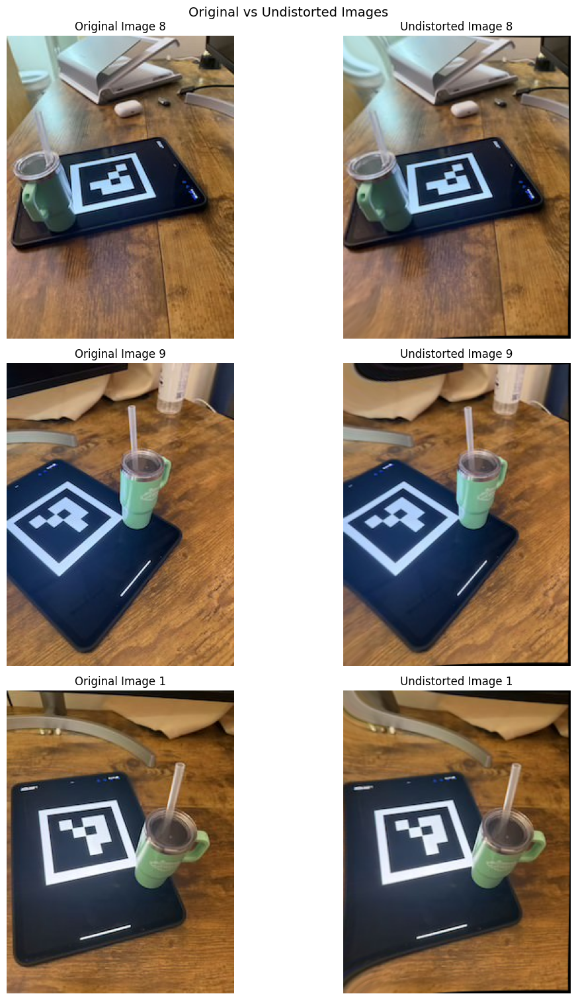

(viser) Connection opened (0, 1 total), 116 persistent messages

(viser) Connection closed (0, 0 total)

(viser) Connection opened (0, 1 total), 608 persistent messages

In [ ]:
sample_indices = np.random.choice(len(images_with_poses), size=min(3, len(images_with_poses)), replace=False)
fig, axes = plt.subplots(3, 2, figsize=(12, 15))

for row, idx in enumerate(sample_indices):
    orig_img = cv2.cvtColor(images_with_poses[idx], cv2.COLOR_BGR2RGB)
    axes[row, 0].imshow(orig_img)
    axes[row, 0].set_title(f"Original Image {idx}", fontsize=12)
    axes[row, 0].axis('off')
    undist_img = cv2.cvtColor(undistorted_images[idx], cv2.COLOR_BGR2RGB)
    axes[row, 1].imshow(undist_img)
    axes[row, 1].set_title(f"Undistorted Image {idx}", fontsize=12)
    axes[row, 1].axis('off')

plt.tight_layout()
plt.suptitle("Original vs Undistorted Images", fontsize=14, y=1.005)
plt.savefig('final_images/01_original_vs_undistorted.png', dpi=150, bbox_inches='tight')
plt.show()


## Sanity Check: Test on Lafufu Dataset

Let's test our calibration implementation on the provided calibration images and Lafufu dataset.


In [ ]:
lafufu_calib_paths = sorted(glob.glob('calibration-images/*.JPG'))

lafufu_obj_points = []
lafufu_img_points = []
lafufu_image_size = None

lafufu_successful_detections = 0
for img_path in lafufu_calib_paths:
    img = cv2.imread(img_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    if lafufu_image_size is None:
        lafufu_image_size = gray.shape[::-1]
    
    corners, ids, rejected = detector.detectMarkers(gray)
    
    if ids is not None and len(ids) > 0:
        lafufu_successful_detections += 1
        for corner in corners:
            corner_points = corner.reshape(4, 2).astype(np.float32)
            lafufu_obj_points.append(object_points)
            lafufu_img_points.append(corner_points)

if len(lafufu_obj_points) >= 10:
    ret_lafufu, K_lafufu, dist_lafufu, rvecs_lafufu, tvecs_lafufu = cv2.calibrateCamera(
        lafufu_obj_points,
        lafufu_img_points,
        lafufu_image_size,
        None,
        None
    )
else:
    pass


In [ ]:
lafufu_image_paths = sorted(glob.glob('lafufu-images/*.JPG'))

lafufu_poses = []
lafufu_images = []
lafufu_successful_poses = 0

for img_path in lafufu_image_paths:
    img = cv2.imread(img_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    corners, ids, rejected = detector.detectMarkers(gray)
    if ids is not None and len(ids) >= 1:
        image_points = corners[0].reshape(4, 2).astype(np.float32)
        success, rvec, tvec = cv2.solvePnP(
            object_points,
            image_points,
            K_lafufu,
            dist_lafufu,
            flags=cv2.SOLVEPNP_ITERATIVE
        )
        if success:
            lafufu_successful_poses += 1
            R_w2c, _ = cv2.Rodrigues(rvec)
            t_w2c = tvec.reshape(3, 1)
            T_w2c = np.eye(4)
            T_w2c[:3, :3] = R_w2c
            T_w2c[:3, 3:4] = t_w2c
            T_c2w = np.linalg.inv(T_w2c)
            c2w = T_c2w[:3, :]
            lafufu_poses.append(c2w)
            lafufu_images.append(img)


In [ ]:
lafufu_undistorted = []
lafufu_c2ws_4x4 = []

for img, c2w_3x4 in zip(lafufu_images, lafufu_poses):
    undist = cv2.undistort(img, K_lafufu, dist_lafufu)
    lafufu_undistorted.append(undist)
    c2w_4x4 = np.vstack([c2w_3x4, [0, 0, 0, 1]])
    lafufu_c2ws_4x4.append(c2w_4x4)

lafufu_undistorted = np.array(lafufu_undistorted)
lafufu_c2ws_4x4 = np.array(lafufu_c2ws_4x4)
lafufu_focal = K_lafufu[0, 0]

N_lafufu = len(lafufu_undistorted)
indices_lafufu = np.arange(N_lafufu)
np.random.seed(42)
np.random.shuffle(indices_lafufu)

n_train_lf = int(0.8 * N_lafufu)
n_val_lf = int(0.1 * N_lafufu)

train_idx_lf = indices_lafufu[:n_train_lf]
val_idx_lf = indices_lafufu[n_train_lf:n_train_lf + n_val_lf]
test_idx_lf = indices_lafufu[n_train_lf + n_val_lf:]

lafufu_images_train = lafufu_undistorted[train_idx_lf]
lafufu_c2ws_train = lafufu_c2ws_4x4[train_idx_lf]
lafufu_images_val = lafufu_undistorted[val_idx_lf]
lafufu_c2ws_val = lafufu_c2ws_4x4[val_idx_lf]
lafufu_c2ws_test = lafufu_c2ws_4x4[test_idx_lf]

np.savez(
    'lafufu_dataset.npz',
    images_train=lafufu_images_train,
    c2ws_train=lafufu_c2ws_train,
    images_val=lafufu_images_val,
    c2ws_val=lafufu_c2ws_val,
    c2ws_test=lafufu_c2ws_test,
    focal=lafufu_focal
)


In [337]:
cup_data = np.load('cup_dataset.npz')
lafufu_data = np.load('lafufu_dataset.npz')


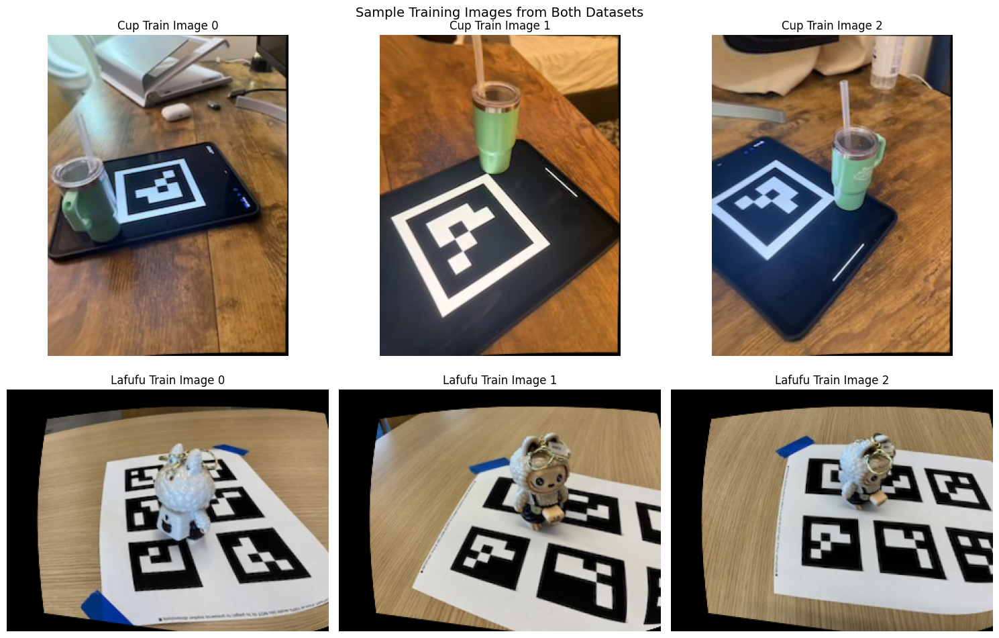

In [418]:
fig, axes = plt.subplots(2, 3, figsize=(15, 10))

for i in range(3):
    img = cup_data['images_train'][i]
    axes[0, i].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    axes[0, i].set_title(f"Cup Train Image {i}", fontsize=12)
    axes[0, i].axis('off')
for i in range(3):
    img = lafufu_data['images_train'][i]
    axes[1, i].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    axes[1, i].set_title(f"Lafufu Train Image {i}", fontsize=12)
    axes[1, i].axis('off')
plt.tight_layout()
plt.suptitle("Sample Training Images from Both Datasets", fontsize=14, y=1.005)
plt.savefig('final_images/02_sample_training_images.png', dpi=150, bbox_inches='tight')
plt.show()


# Part 1: Fit a Neural Field to a 2D Image

Using a neural network to represent and reconstruct a 2D image through coordinate-based learning.


In [339]:
!pip install torch

python(90598) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader

device = torch.device('mps')

In [ ]:
class PositionalEncoding:
    def __init__(self, L=10):
        self.L = L
        self.freq_bands = 2.0 ** torch.arange(L)
    
    def __call__(self, x):
        self.freq_bands = self.freq_bands.to(x.device)
        encoded = [x]
        
        for freq in self.freq_bands:
            encoded.append(torch.sin(2 * np.pi * freq * x))
            encoded.append(torch.cos(2 * np.pi * freq * x))
        
        return torch.cat(encoded, dim=-1)
    
    def output_dim(self, input_dim):
        return input_dim + 2 * input_dim * self.L

pe = PositionalEncoding(L=10)
test_coords = torch.tensor([[0.5, 0.5], [0.0, 1.0]])
encoded = pe(test_coords)


In [ ]:
class NeuralField2D(nn.Module):
    def __init__(self, L=10, hidden_width=256, num_hidden_layers=3):
        super(NeuralField2D, self).__init__()
        
        self.pe = PositionalEncoding(L=L)
        input_dim = self.pe.output_dim(2)
        
        layers = []
        layers.append(nn.Linear(input_dim, hidden_width))
        layers.append(nn.ReLU())

        for _ in range(num_hidden_layers - 1):
            layers.append(nn.Linear(hidden_width, hidden_width))
            layers.append(nn.ReLU())

        layers.append(nn.Linear(hidden_width, 3))
        layers.append(nn.Sigmoid())

        self.network = nn.Sequential(*layers)
        self.L = L
        self.hidden_width = hidden_width
        self.num_hidden_layers = num_hidden_layers

    def forward(self, coords):
        encoded = self.pe(coords)
        rgb = self.network(encoded)
        return rgb

    def __str__(self):
        return f"NeuralField2D(L={self.L}, width={self.hidden_width}, layers={self.num_hidden_layers})"

model = NeuralField2D(L = 10, hidden_width = 256, num_hidden_layers = 3)
test_input = torch.rand(5, 2)
test_output = model(test_input)


In [ ]:
class ImageDataset(Dataset):
    def __init__(self, image_path, num_samples = 10000):
        img = Image.open(image_path).convert('RGB')
        img = np.array(img)
        self.H, self.W = img.shape[:2]
        self.num_samples = num_samples
        
        y_coords, x_coords = np.meshgrid(np.arange(self.H), np.arange(self.W), indexing='ij')
        self.coords = np.stack([
            x_coords.flatten() / self.W,
            y_coords.flatten() / self.H
        ], axis=-1).astype(np.float32)
        self.rgbs = img.reshape(-1, 3).astype(np.float32) / 255.0

    def __len__(self):
        return len(self.coords)

    def __getitem__(self, idx):
        return self.coords[idx], self.rgbs[idx]

    def get_batch(self):
        indices = np.random.choice(len(self), size=self.num_samples, replace=False)
        coords_batch = torch.from_numpy(self.coords[indices])
        rgbs_batch = torch.from_numpy(self.rgbs[indices])
        return coords_batch, rgbs_batch

    def get_all_data(self):
        return torch.from_numpy(self.coords), torch.from_numpy(self.rgbs)

dataset = ImageDataset('fox/fox.jpg', num_samples=10000)
coords_batch, rgbs_batch = dataset.get_batch()


Loaded image: fox/fox.jpg
  Resolution: 1024 x 689
  Total pixels: 705,536
  Samples per iteration: 10,000

Batch shapes:
  Coordinates: torch.Size([10000, 2])
  RGB values: torch.Size([10000, 3])
  Coord range: [0.000, 0.999]
  RGB range: [0.000, 1.000]


(viser) Connection opened (1, 1 total), 608 persistent messages

In [ ]:
def compute_psnr(mse):
    return -10.0 * torch.log10(mse)

def evaluate_model(model, dataset, device, batch_size = 50000):
    model.eval()
    coords, rgbs_gt = dataset.get_all_data()
    all_preds = []
    num_pixels = len(coords)

    with torch.no_grad():
        for i in range(0, num_pixels, batch_size):
            batch_coords = coords[i:i+batch_size].to(device)
            batch_preds = model(batch_coords)
            all_preds.append(batch_preds.cpu())

    rgbs_pred = torch.cat(all_preds, dim=0)
    mse = torch.mean((rgbs_pred - rgbs_gt) ** 2)
    psnr = compute_psnr(mse)

    return mse.item(), psnr.item(), rgbs_pred

def render_image(model, dataset, device):
    x, y, rgbs_pred = evaluate_model(model, dataset, device)
    img = rgbs_pred.reshape(dataset.H, dataset.W, 3).numpy()
    img = (img * 255).clip(0, 255).astype(np.uint8)
    return img



In [ ]:
def train_neural_field(model, dataset, num_iters = 2000, lr = 1e-2, eval_every = 100, save_images_at = None, device = 'cpu'):
    model = model.to(device)
    model.train()
    criterion = nn.MSELoss()
    optimizer = optim.Adam(model.parameters(), lr = lr)
    
    history = {
        'iters': [],
        'mse_train': [],
        'psnr_train': [],
        'mse_val': [],
        'psnr_val': [],
        'intermediate_images': {}
    }

    if save_images_at is None:
        save_images_at = []

    for iter_idx in range(num_iters):
        coords_batch, rgbs_batch = dataset.get_batch()
        coords_batch = coords_batch.to(device)
        rgbs_batch = rgbs_batch.to(device)
        
        rgbs_pred = model(coords_batch)
        loss = criterion(rgbs_pred, rgbs_batch)
        
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        if (iter_idx + 1) % eval_every == 0 or iter_idx == 0:
            mse_val, psnr_val, _ = evaluate_model(model, dataset, device)
            history['iters'].append(iter_idx + 1)
            history['mse_train'].append(loss.item())
            history['psnr_train'].append(compute_psnr(loss).item())
            history['mse_val'].append(mse_val)
            history['psnr_val'].append(psnr_val)
            model.train()

        if (iter_idx + 1) in save_images_at or (iter_idx == 0 and 0 in save_images_at):
            img = render_image(model, dataset, device)
            history['intermediate_images'][iter_idx + 1] = img
            model.train()

    return history


In [ ]:
torch.manual_seed(42)
np.random.seed(42)

fox_dataset = ImageDataset('fox/fox.jpg', num_samples = 10000)
fox_model = NeuralField2D(L = 10, hidden_width =256, num_hidden_layers = 3)
save_at = [1, 100, 300, 500, 1000, 1500, 2000]

fox_history = train_neural_field(
    fox_model,
    fox_dataset,
    num_iters= 2000,
    lr = 1e-2,
    eval_every = 100,
    save_images_at = save_at,
    device = device
)


Loaded image: fox/fox.jpg
  Resolution: 1024 x 689
  Total pixels: 705,536
  Samples per iteration: 10,000


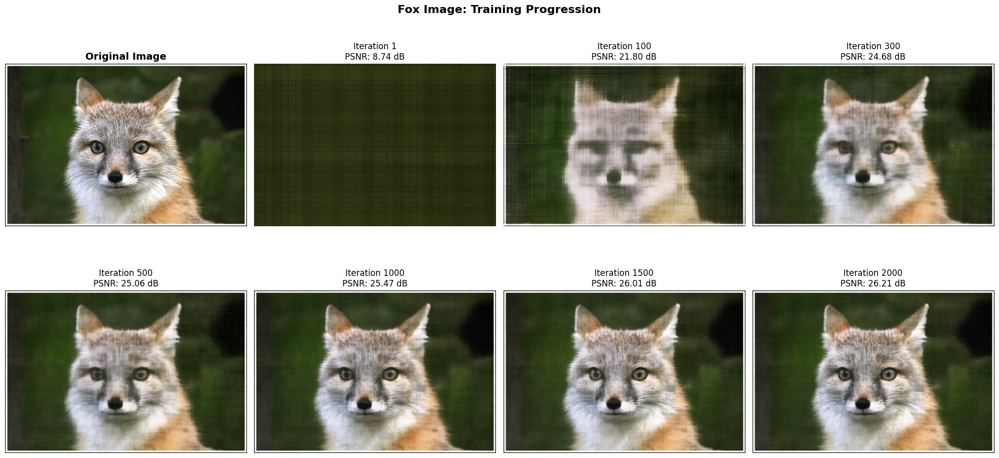

In [419]:
fig, axes = plt.subplots(2, 4, figsize = (20, 10))
axes = axes.flatten()

original_img = Image.open('fox/fox.jpg')
axes[0].imshow(original_img)
axes[0].set_title('Original Image', fontsize = 14, fontweight = 'bold')
axes[0].axis('off')

for idx, iter_num in enumerate([1, 100, 300, 500, 1000, 1500, 2000]):
    if iter_num in fox_history['intermediate_images']:
        img = fox_history['intermediate_images'][iter_num]
        axes[idx + 1].imshow(img)
        psnr_val = None
        if iter_num in fox_history['iters']:
            psnr_idx = fox_history['iters'].index(iter_num)
            psnr_val = fox_history['psnr_val'][psnr_idx]
        if psnr_val is not None:
            axes[idx + 1].set_title(f'Iteration {iter_num}\nPSNR: {psnr_val:.2f} dB', fontsize = 12)
        else:
            axes[idx + 1].set_title(f'Iteration {iter_num}', fontsize = 12)
        axes[idx + 1].axis('off')

plt.tight_layout()
plt.suptitle('Fox Image: Training Progression', fontsize = 16, fontweight = 'bold', y = 1.005)
plt.savefig('final_images/03_fox_training_progression.png', dpi=150, bbox_inches='tight')
plt.show()


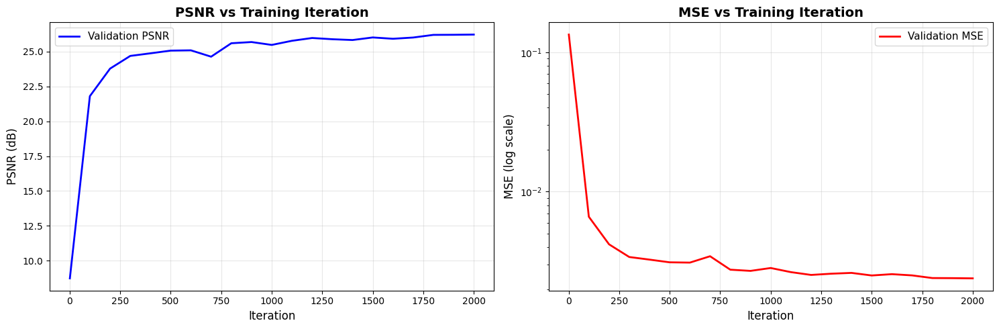

In [420]:

fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (15, 5))

ax1.plot(fox_history['iters'], fox_history['psnr_val'], 'b-', linewidth = 2, label = 'Validation PSNR')
ax1.set_xlabel('Iteration', fontsize = 12)
ax1.set_ylabel('PSNR (dB)', fontsize = 12)
ax1.set_title('PSNR vs Training Iteration', fontsize = 14, fontweight = 'bold')
ax1.grid(True, alpha = 0.3)
ax1.legend(fontsize = 11)

ax2.semilogy(fox_history['iters'], fox_history['mse_val'], 'r-', linewidth = 2, label = 'Validation MSE')
ax2.set_xlabel('Iteration', fontsize = 12)
ax2.set_ylabel('MSE (log scale)', fontsize = 12)
ax2.set_title('MSE vs Training Iteration', fontsize = 14, fontweight = 'bold')
ax2.grid(True, alpha = 0.3)
ax2.legend(fontsize = 11)

plt.tight_layout()
plt.savefig('final_images/04_fox_psnr_curve.png', dpi=150, bbox_inches='tight')
plt.show()

final_psnr = fox_history['psnr_val'][ -1 ]
final_mse = fox_history['mse_val'][ -1 ]



## Hyperparameter Experiments

Testing different values for positional encoding frequency (L) and network width.


In [ ]:
experiments = {
    'Low L (2), Low Width (64)': {'L': 2, 'width': 64},
    'Low L (2), High Width (256)': {'L': 2, 'width': 256},
    'High L (10), Low Width (64)': {'L': 10, 'width': 64},
    'High L (10), High Width (256)': {'L': 10, 'width': 256},
}

results = {}

for exp_name, params in experiments.items():
    torch.manual_seed(42)
    np.random.seed(42)

    model = NeuralField2D(L=params['L'], hidden_width=params['width'], num_hidden_layers=3)

    history = train_neural_field(
        model,
        fox_dataset,
        num_iters=2000,
        lr=1e-2,
        eval_every=200,
        save_images_at=[2000],
        device=device
    )

    results[exp_name] = {
        'params': params,
        'history': history,
        'final_image': history['intermediate_images'][2000],
        'final_psnr': history['psnr_val'][-1]
    }



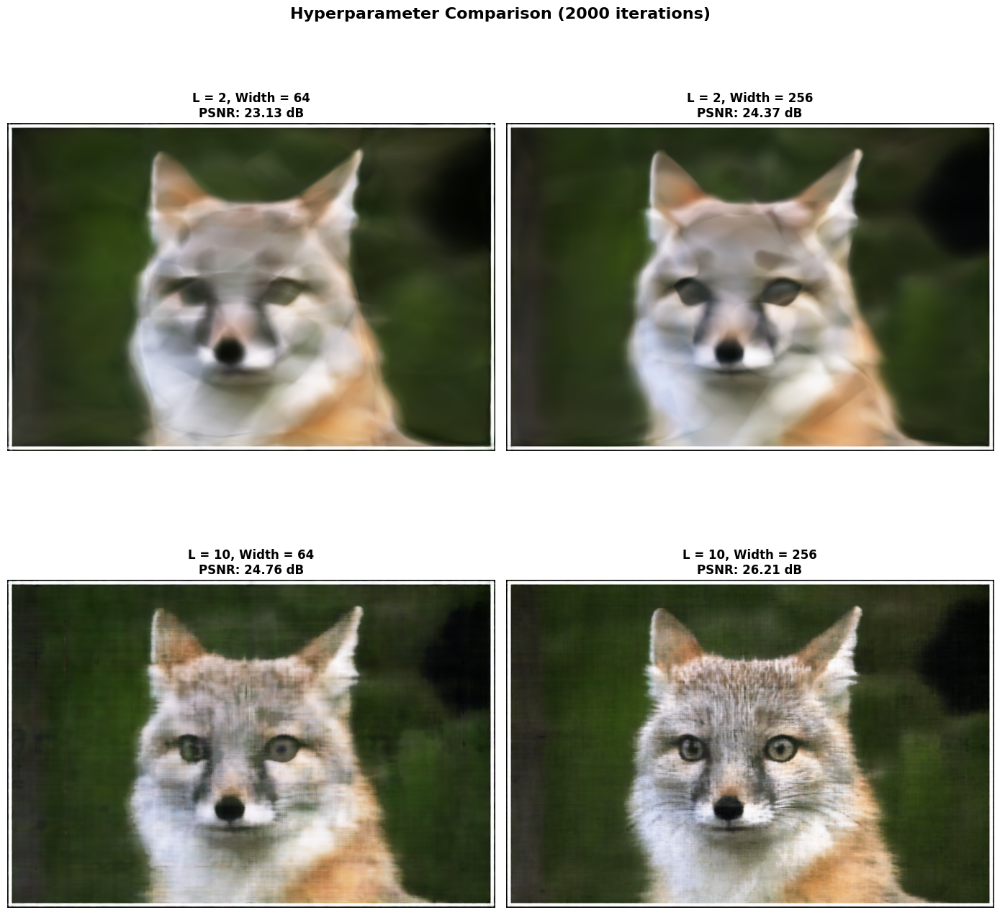

In [421]:
fig, axes = plt.subplots(2, 2, figsize = (14, 14))

exp_names = [
    'Low L (2), Low Width (64)',
    'Low L (2), High Width (256)',
    'High L (10), Low Width (64)',
    'High L (10), High Width (256)'
]

positions = [(0, 0), (0, 1), (1, 0), (1, 1)]

for exp_name, (row, col) in zip(exp_names, positions):
    result = results[exp_name]
    img = result['final_image']
    psnr = result['final_psnr']
    params = result['params']

    axes[row, col].imshow(img)
    axes[row, col].set_title(
        f"L = {params['L']}, Width = {params['width']}\nPSNR: {psnr:.2f} dB",
        fontsize=12,
        fontweight='bold'
    )
    axes[row, col].axis('off')

plt.tight_layout()
plt.suptitle(
    'Hyperparameter Comparison (2000 iterations)',
    fontsize = 16,
    fontweight = 'bold',
    y = 1.005
)
plt.savefig('final_images/05_hyperparameter_comparison.png', dpi=150, bbox_inches='tight')
plt.show()


In [ ]:
def compute_psnr(arg1, arg2=None):

    if arg2 is None:
        mse_t = arg1 if isinstance(arg1, torch.Tensor) else torch.tensor(float(arg1), dtype=torch.float32)
        return -10.0 * torch.log10(mse_t)

    img1 = np.asarray(arg1, dtype=np.float32)
    img2 = np.asarray(arg2, dtype=np.float32)
    mse = np.mean((img1 - img2) ** 2)
    if mse == 0:
        return float('inf')
    return 10.0 * np.log10(1.0 / mse)


In [ ]:
try:
    render_image_nerf = render_image
except NameError:
    render_image_nerf = None


def render_image(*args, **kwargs):
    if len(args) == 3:
        model, dataset, device = args
        if hasattr(dataset, 'H') and hasattr(dataset, 'W'):
            x, y, rgbs_pred = evaluate_model(model, dataset, device)
            img = rgbs_pred.reshape(dataset.H, dataset.W, 3).numpy()

            return (img * 255).clip(0, 255).astype(np.uint8)

    if render_image_nerf is not None:
        return render_image_nerf(*args, **kwargs)

Loaded image: dog/beagle-hound-dog copy.jpg
  Resolution: 800 x 529
  Total pixels: 423,200
  Samples per iteration: 10,000


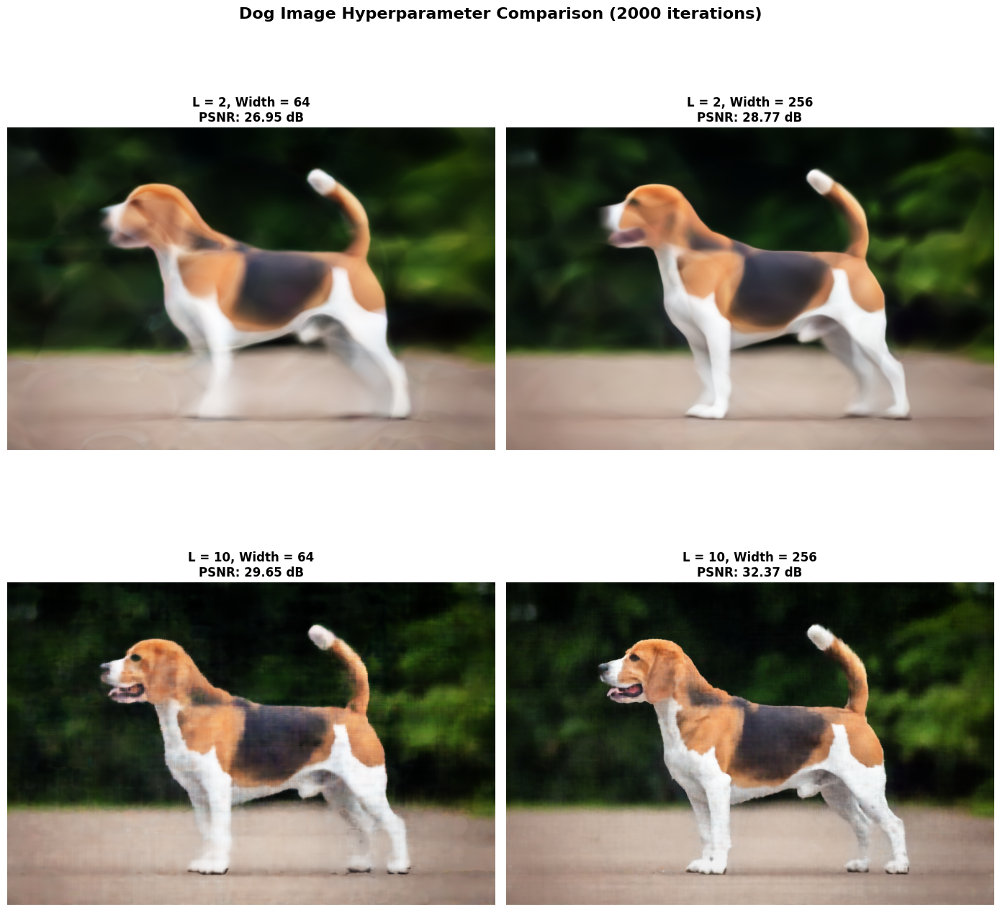

In [ ]:
dog_image_path = 'dog/beagle-hound-dog copy.jpg'

torch.manual_seed(42)
np.random.seed(42)

dog_dataset = ImageDataset(dog_image_path, num_samples=10000)

experiments_dog = {
    'Low L (2), Low Width (64)': {'L': 2, 'width': 64},
    'Low L (2), High Width (256)': {'L': 2, 'width': 256},
    'High L (10), Low Width (64)': {'L': 10, 'width': 64},
    'High L (10), High Width (256)': {'L': 10, 'width': 256},
}

results_dog = {}

for exp_name, params in experiments_dog.items():
    torch.manual_seed(42)
    np.random.seed(42)

    model = NeuralField2D(L=params['L'], hidden_width=params['width'], num_hidden_layers=3)

    history = train_neural_field(
        model,
        dog_dataset,
        num_iters=2000,
        lr=1e-2,
        eval_every=200,
        save_images_at=[2000],
        device=device
    )

    results_dog[exp_name] = {
        'params': params,
        'history': history,
        'final_image': history['intermediate_images'][2000],
        'final_psnr': history['psnr_val'][-1]
    }

fig, axes = plt.subplots(2, 2, figsize=(14, 14))

exp_names = [
    'Low L (2), Low Width (64)',
    'Low L (2), High Width (256)',
    'High L (10), Low Width (64)',
    'High L (10), High Width (256)'
]

positions = [(0, 0), (0, 1), (1, 0), (1, 1)]

for exp_name, (row, col) in zip(exp_names, positions):
    result = results_dog[exp_name]
    img = result['final_image']
    psnr = result['final_psnr']
    params = result['params']

    axes[row, col].imshow(img)
    axes[row, col].set_title(
        f"L = {params['L']}, Width = {params['width']}\nPSNR: {psnr:.2f} dB",
        fontsize=12,
        fontweight='bold'
    )
    axes[row, col].axis('off')

plt.tight_layout()
plt.suptitle(
    'Dog Image Hyperparameter Comparison (2000 iterations)',
    fontsize=16,
    fontweight='bold',
    y=1.005
)
plt.savefig('final_images/05b_dog_hyperparameter_comparison.png', dpi=150, bbox_inches='tight')
plt.show()


## Training on Custom Image

Test the neural field on your own image choice.


In [ ]:
custom_image_path = 'cup_images/IMG_2232.jpg'

torch.manual_seed(42)
np.random.seed(42)

custom_dataset = ImageDataset(custom_image_path , num_samples = 10000)
custom_model = NeuralField2D(L = 10 , hidden_width = 256 , num_hidden_layers = 3)

save_at_custom = [1 , 100 , 300 , 500 , 1000 , 1500 , 2000]
custom_history = train_neural_field(
    custom_model,
    custom_dataset ,
    num_iters = 2000,
    lr = 1e-2 ,
    eval_every = 100,
    save_images_at = save_at_custom,
    device = device
)

Loaded image: cup_images/IMG_2232.jpg
  Resolution: 240 x 320
  Total pixels: 76,800
  Samples per iteration: 10,000


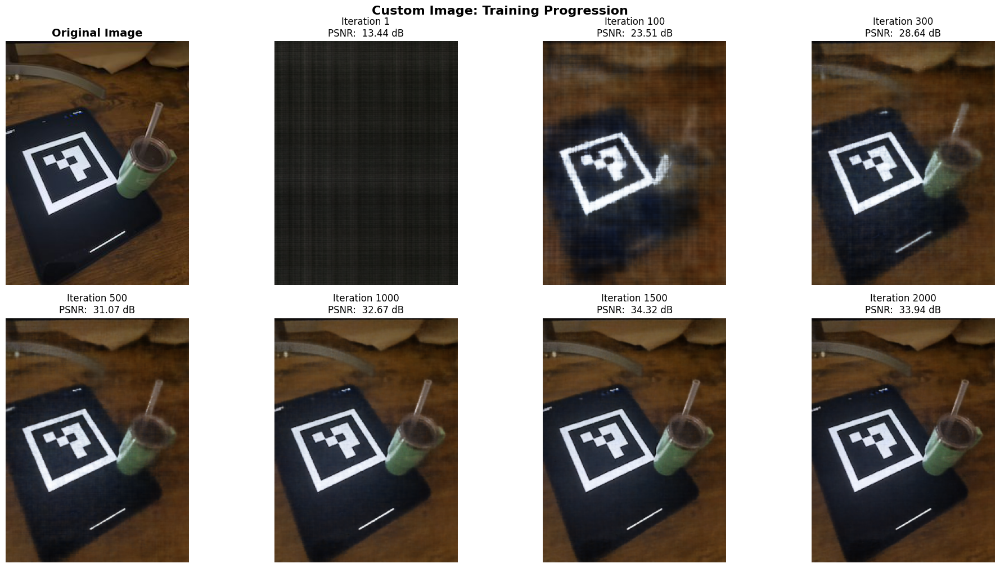

In [422]:
fig , axes = plt.subplots(2 , 4 , figsize = (20 , 10))
axes = axes.flatten()

original_custom = Image.open(custom_image_path)
axes[0].imshow(original_custom)
axes[0].set_title('Original Image' , fontsize = 14 , fontweight = 'bold')
axes[0].axis('off')

for idx , iter_num in enumerate([1 , 100 , 300 , 500 , 1000 , 1500 , 2000]):
    if iter_num in custom_history['intermediate_images']:
        img = custom_history['intermediate_images'][iter_num]
        axes[idx + 1].imshow(img)

        psnr_val = None
        if iter_num in custom_history['iters']:
            psnr_idx = custom_history['iters'].index(iter_num)
            psnr_val = custom_history['psnr_val'][psnr_idx]

        if psnr_val is not None:
            axes[idx + 1].set_title(f'Iteration {iter_num}\nPSNR: {psnr_val : .2f} dB', fontsize = 12)
        else:
            axes[idx + 1].set_title(f'Iteration {iter_num}' , fontsize = 12)
        axes[idx + 1].axis('off')

plt.tight_layout()
plt.suptitle('Custom Image: Training Progression', fontsize = 16, fontweight = 'bold', y = 1.005)
plt.savefig('final_images/06_custom_image_training_progression.png', dpi=150, bbox_inches='tight')
plt.show()

final_psnr = custom_history['psnr_val'][ -1 ]
final_mse = custom_history['mse_val'][ -1 ]


In [353]:
focal = float(focal)


# Part 2: Fit a Neural Radiance Field from Multi-view Images

Implementing NeRF to reconstruct 3D scenes from 2D images with known camera poses.


In [354]:
dataset_path = "lego_200x200 (1).npz"
data = np.load(dataset_path)

images_train = data["images_train"].astype(np.float32) / 255.0
c2ws_train = data["c2ws_train"]

images_val = data["images_val"] / 255.0
c2ws_val = data["c2ws_val"]

c2ws_test = data["c2ws_test"]

focal = data["focal"]


In [391]:
def create_intrinsic_matrix(focal_length, width, height):
    K = torch.zeros((3, 3), dtype = torch.float32 )
    K[0, 0] = float(focal_length)
    K[1, 1] = float(focal_length)
    K[0, 2] = width / 2
    K[1, 2] = height / 2
    K[2, 2] = 1.0
    return K

H, W = images_train.shape[1:3]
K_train = create_intrinsic_matrix(focal, W, H)


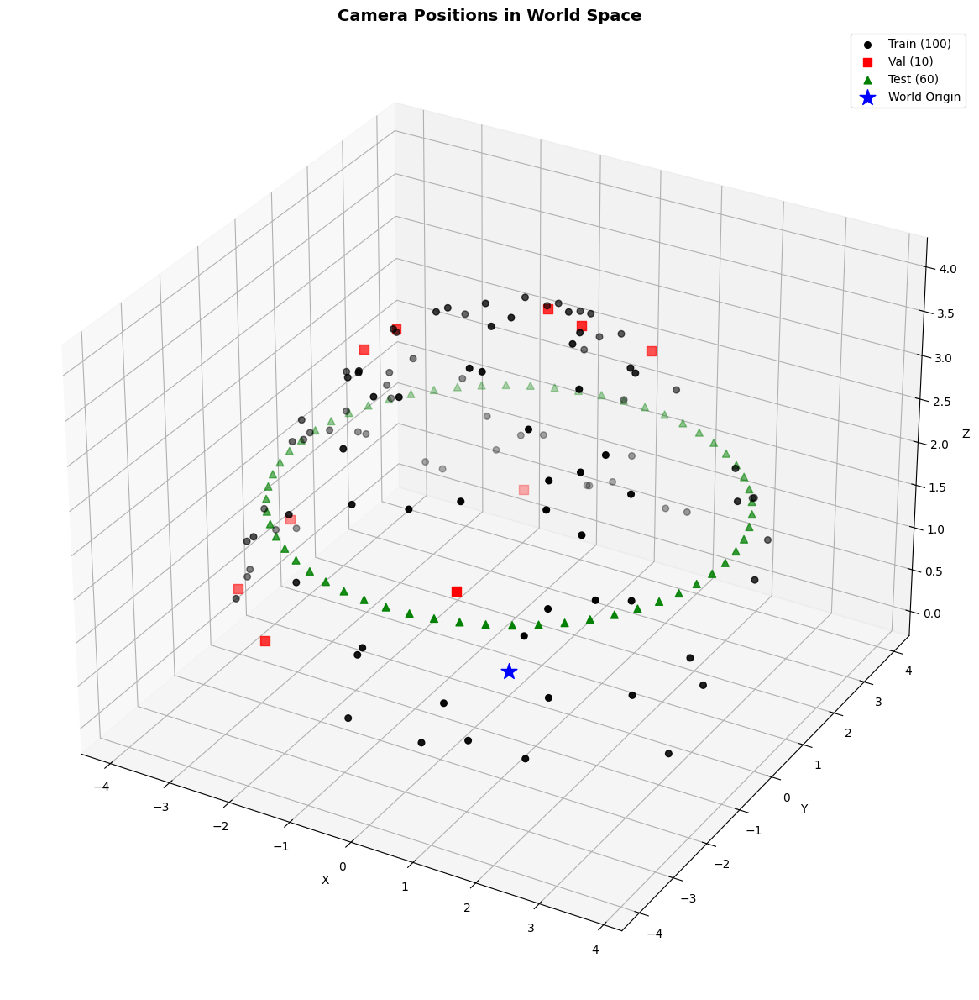

In [434]:
fig = plt.figure(figsize = (12, 12))
ax = fig.add_subplot(111, projection = '3d')

def plot_cameras(c2ws, color, label, marker = 'o', size = 20):
    positions = c2ws[:, :3, 3]
    ax.scatter(positions[:, 0], positions[:, 1], positions[:, 2], c = color, label = label, marker = marker, s = size )

plot_cameras(c2ws_train, 'black', 'Train (100)', marker = 'o', size = 30)
plot_cameras(c2ws_val, 'red', 'Val (10)', marker = 's', size = 60)
plot_cameras(c2ws_test, 'green', 'Test (60)', marker = '^', size = 40)

ax.scatter([0], [0], [0], c = 'blue', marker = '*', s = 200, label = 'World Origin')

ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.set_title('Camera Positions in World Space', fontsize = 14, fontweight = 'bold')
ax.legend()
plt.tight_layout()
plt.savefig('final_images/07_camera_positions.png', dpi=150, bbox_inches='tight')
plt.show()


## Part 2.1: Create Rays from Cameras

Implementing coordinate transformations: camera ↔ world, pixel ↔ camera, pixel → ray.


In [ ]:
def transform(c2w, x_c):
    is_numpy = isinstance(x_c, np.ndarray)

    if is_numpy:
        c2w = torch.from_numpy(c2w).float()
        x_c = torch.from_numpy(x_c).float()

    original_shape = x_c.shape

    if x_c.shape[-1] == 3:
        ones = torch.ones(*x_c.shape[:-1], 1, device = x_c.device, dtype = x_c.dtype)
        x_c_homo = torch.cat([x_c, ones], dim = -1)

    else:
        x_c_homo = x_c

    x_c_homo = x_c_homo.reshape(-1, 4, 1)

    if c2w.dim() == 2:

        x_w_homo = c2w @ x_c_homo
    
    else:
        x_w_homo = torch.bmm(c2w, x_c_homo)
    
    x_w = x_w_homo[..., :3, 0]
    x_w = x_w.reshape(*original_shape[:-1], 3)
    
    if is_numpy:
        x_w = x_w.numpy()
    
    return x_w


In [ ]:
def pixel_to_camera(K, uv, s):
    is_numpy = isinstance(uv, np.ndarray)
    
    if is_numpy:
        K = torch.from_numpy(K).float() if isinstance(K, np.ndarray) else torch.tensor(K).float()
        uv = torch.from_numpy(uv).float()
        s = torch.from_numpy(s).float() if isinstance(s, np.ndarray) else torch.tensor(s).float()

    fx, fy = K[0, 0], K[1, 1]
    cx, cy = K[0, 2], K[1, 2]
    u = uv[..., 0]
    v = uv[..., 1]

    if s.dim() == uv.dim() - 1:
        s = s.unsqueeze(-1).squeeze(-1)
    elif s.shape[-1] == 1:
        s = s.squeeze(-1)

    X_c = s * (u - cx) / fx
    Y_c = s * (v - cy) / fy
    Z_c = s
    x_c = torch.stack([X_c, Y_c, Z_c], dim = -1)

    if is_numpy:
        x_c = x_c.numpy()
        
    return x_c


In [ ]:
def pixel_to_ray(K, c2w, uv):
    is_numpy = isinstance(uv, np.ndarray)

    if is_numpy:
        K = torch.from_numpy(K).float() if isinstance(K, np.ndarray) else torch.tensor(K).float()
        c2w = torch.from_numpy(c2w).float()
        uv = torch.from_numpy(uv).float()

    if c2w.dim() == 2:
        ray_o = c2w[:3, 3]
        ray_o = ray_o.expand(*uv.shape[:-1], 3)
    else:
        ray_o = c2w[:, :3, 3]

    s = torch.ones(uv.shape[:-1], device = uv.device, dtype = uv.dtype)
    x_c = pixel_to_camera(K, uv, s)
    x_w = transform(c2w, x_c)
    ray_d_unnorm = x_w - ray_o
    ray_d = ray_d_unnorm / torch.norm(ray_d_unnorm, dim = -1, keepdim = True)

    if is_numpy:
        ray_o = ray_o.numpy()
        ray_d = ray_d.numpy()
        
    return ray_o, ray_d


## Part 2.2: Sampling

Sampling rays from images and sampling points along those rays for NeRF training.


In [ ]:
def sample_rays_from_images(images, c2ws, K, num_rays, device = 'cpu'):
    N_images, H, W, _ = images.shape
    total_pixels = N_images * H * W
    sampled_indices = np.random.choice(total_pixels, size = num_rays, replace = False)
    
    image_idx = sampled_indices // (H * W)
    pixel_idx = sampled_indices % (H * W)
    y_coords = pixel_idx // W
    x_coords = pixel_idx % W
    u_coords = x_coords + 0.5
    v_coords = y_coords + 0.5
    
    u_coords = torch.from_numpy(u_coords).float().to(device)
    v_coords = torch.from_numpy(v_coords).float().to(device)
    uv_coords = torch.stack([u_coords, v_coords], dim = -1)
    
    rgb_gt = []
    for i in range(num_rays):
        img_idx = image_idx[i]
        y = y_coords[i]
        x = x_coords[i]
        rgb_gt.append(images[img_idx, y, x])

    rgb_gt = torch.from_numpy(np.array(rgb_gt)).float().to(device)
    rays_o_list = []
    rays_d_list = []
    K_torch = K.to(device) if isinstance(K, torch.Tensor) else torch.from_numpy(K).float().to(device)

    for i in range(num_rays):
        img_idx = image_idx[i]
        c2w = torch.from_numpy(c2ws[img_idx]).float().to(device)
        uv = uv_coords[i:i+1]
        ray_o, ray_d = pixel_to_ray(K_torch, c2w, uv)
        rays_o_list.append(ray_o)
        rays_d_list.append(ray_d)

    rays_o = torch.cat(rays_o_list, dim = 0)
    rays_d = torch.cat(rays_d_list, dim = 0)
    
    return rays_o, rays_d, rgb_gt


In [ ]:
def sample_points_along_rays(rays_o, rays_d, near = 2.0, far = 6.0, n_samples = 64, perturb = True):
    num_rays = rays_o.shape[0]
    dev = rays_o.device
    
    t = torch.linspace(0.0, 1.0, n_samples, device = dev)
    z_vals = near * (1.0 - t) + far * t
    z_vals = z_vals.expand(num_rays, n_samples)

    if perturb:
        mids = 0.5 * (z_vals[:, :-1] + z_vals[:, 1:])
        upper = torch.cat([mids, z_vals[:, -1:]], dim = -1)
        lower = torch.cat([z_vals[:, :1], mids], dim = -1)
        t_rand = torch.rand(z_vals.shape, device = dev)
        z_vals = lower + (upper - lower) * t_rand

    points = rays_o[:, None, :] + z_vals[:, :, None] * rays_d[:, None, :]
    
    return points, z_vals

test_rays_o = rays_o[:5]
test_rays_d = rays_d[:5]

pts_uniform, z_vals_uniform = sample_points_along_rays(
    test_rays_o, test_rays_d,
    near = 2.0, far = 6.0, n_samples = 64, perturb = False
)

pts_perturbed, z_vals_perturbed = sample_points_along_rays(
    test_rays_o, test_rays_d,
    near = 2.0, far = 6.0, n_samples = 64, perturb = True
)

ray_idx = 0
sample_idx = 0
expected_pt = test_rays_o[ray_idx] + z_vals_uniform[ray_idx, sample_idx] * test_rays_d[ray_idx]
actual_pt = pts_uniform[ray_idx, sample_idx]


## Part 2.3: Putting the Dataloading All Together

Complete dataloader that pre-computes rays and enables efficient batch sampling.


In [ ]:
class RaysDataset:
    def __init__(self, images, K, c2ws, device = 'cpu'):
        self.device = device
        self.images = images
        self.c2ws = c2ws
        self.K = K
        
        N_images, H, W, _ = images.shape
        self.N_images = N_images
        self.H = H
        self.W = W
        
        all_rays_o = []
        all_rays_d = []
        all_pixels = []
        all_uvs = []
        
        K_torch = torch.from_numpy(K).float() if isinstance(K, np.ndarray) else K
        
        for img_idx in range(N_images):
            x_coords, y_coords = np.meshgrid(np.arange(W), np.arange(H), indexing = 'xy')
            
            u_coords = x_coords + 0.5
            v_coords = y_coords + 0.5
            
            uv = np.stack([u_coords, v_coords], axis = -1)
            pixels = images[img_idx]
            
            uv_flat = uv.reshape(-1, 2)
            pixels_flat = pixels.reshape(-1, 3)
            
            uv_torch = torch.from_numpy(uv_flat).float().to(device)
            c2w = torch.from_numpy(c2ws[img_idx]).float().to(device)
            
            rays_o, rays_d = pixel_to_ray(K_torch.to(device), c2w, uv_torch)
            
            all_rays_o.append(rays_o.cpu().numpy())
            all_rays_d.append(rays_d.cpu().numpy())
            all_pixels.append(pixels_flat)
            all_uvs.append(x_coords.flatten().astype(np.int32))
            all_uvs.append(y_coords.flatten().astype(np.int32))
        
        self.rays_o = np.concatenate(all_rays_o, axis = 0)
        self.rays_d = np.concatenate(all_rays_d, axis = 0)
        self.pixels = np.concatenate(all_pixels, axis = 0)
        
        self.uvs = np.zeros((N_images * H * W, 2), dtype = np.int32)
        for img_idx in range(N_images):
            start_idx = img_idx * H * W
            end_idx = (img_idx + 1) * H * W
            x_coords, y_coords = np.meshgrid(np.arange(W), np.arange(H), indexing = 'xy')
            self.uvs[start_idx:end_idx, 0] = x_coords.flatten()
            self.uvs[start_idx:end_idx, 1] = y_coords.flatten()
    
    def __len__(self):
        return len(self.rays_o)
    
    def sample_rays(self, num_rays):
        indices = np.random.choice(len(self), size = num_rays, replace = False)
        
        rays_o = torch.from_numpy(self.rays_o[indices]).float().to(self.device)
        rays_d = torch.from_numpy(self.rays_d[indices]).float().to(self.device)
        pixels = torch.from_numpy(self.pixels[indices]).float().to(self.device)
        
        return rays_o, rays_d, pixels

In [ ]:
dataset = RaysDataset(images_train, K_train.numpy(), c2ws_train, device = device)

In [383]:
uvs_start = 0
uvs_end = 40_000
sample_uvs = dataset.uvs[uvs_start:uvs_end]

pixels_from_image = images_train[0, sample_uvs[:, 1], sample_uvs[:, 0]]
pixels_from_dataset = dataset.pixels[uvs_start:uvs_end]

match = np.allclose(pixels_from_image, pixels_from_dataset, atol=1e-6)


In [ ]:
def sample_along_rays(rays_o, rays_d, near = 2.0, far = 6.0, n_samples = 64, random = True):
    
    if isinstance(rays_o, np.ndarray):
        rays_o_torch = torch.from_numpy(rays_o).float()
    else:
        rays_o_torch = rays_o.float() if rays_o.dtype != torch.float32 else rays_o
    
    if isinstance(rays_d, np.ndarray):
        rays_d_torch = torch.from_numpy(rays_d).float()
    else:
        rays_d_torch = rays_d.float() if rays_d.dtype != torch.float32 else rays_d
    
    points, x = sample_points_along_rays(
        rays_o_torch, rays_d_torch,
        near = near, far = far, n_samples = n_samples, perturb = random
    )
    
    return points.cpu().numpy()


In [470]:
import viser
import time

indices = np.random.randint(low = 0, high = H*W, size = 100)
data = {
    "rays_o": dataset.rays_o[indices],
    "rays_d": dataset.rays_d[indices]
}

points = sample_along_rays(data["rays_o"], data["rays_d"], random = True)

server = viser.ViserServer(share = True)

for i, (image, c2w) in enumerate(zip(images_train, c2ws_train)):
    image_uint8 = (image * 255).astype(np.uint8)
    
    server.scene.add_camera_frustum(
        f"/cameras/{i}",
        fov = 2 * np.arctan2(H / 2, K_train[0, 0].item()),
        aspect = W / H,
        scale = 0.15,
        wxyz = viser.transforms.SO3.from_matrix(c2w[:3, :3]).wxyz,
        position = c2w[:3, 3],
        image = image_uint8
    )

for i, (o, d) in enumerate(zip(data["rays_o"], data["rays_d"])):
    positions = np.stack((o, o + d * 6.0))
    server.scene.add_spline_catmull_rom(
        f"/rays/{i}",
        positions = positions,
        color = (255, 0, 0),
        line_width = 2.0
    )


╭────── viser (listening *:8092) ───────╮
│             ╷                         │
│   HTTP      │ http://localhost:8092   │
│   Websocket │ ws://localhost:8092     │
│             ╵                         │
╰───────────────────────────────────────╯

(viser) Share URL requested!

python(76788) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(76789) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


(viser) Generated share URL (expires in 24 hours, max 16 clients): https://pca-codec.share.viser.studio

In [471]:

server.scene.add_point_cloud(
    f"/samples",
    colors = np.ones_like(points).reshape(-1, 3) * np.array([0, 255, 0]),
    points = points.reshape(-1, 3),
    point_size = 0.03,
)


PointCloudHandle(points=array([[ 0.56   ,  2.002  ,  0.6587 ],
       [ 0.5757 ,  1.953  ,  0.6445 ],
       [ 0.598  ,  1.886  ,  0.6245 ],
       ...,
       [ 0.581  , -1.892  ,  0.09454],
       [ 0.591  , -1.977  ,  0.07794],
       [ 0.5913 , -1.983  ,  0.0767 ]], dtype=float16), colors=array([[  0, 255,   0],
       [  0, 255,   0],
       [  0, 255,   0],
       ...,
       [  0, 255,   0],
       [  0, 255,   0],
       [  0, 255,   0]], dtype=uint8), point_size=0.03, point_shape='square', precision='float16')

## Part 2.4: Neural Radiance Field Network

Implementing the NeRF MLP that predicts density and color from 3D positions and view directions.


In [ ]:
class NeRF(nn.Module):
    def __init__(self, pos_L = 10, dir_L = 4, hidden_dim = 256):
        super(NeRF, self).__init__()
        
        self.pos_L = pos_L
        self.dir_L = dir_L
        self.hidden_dim = hidden_dim
        
        self.pos_encoder = PositionalEncoding(L = pos_L)
        self.dir_encoder = PositionalEncoding(L = dir_L)
        
        pos_encoded_dim = self.pos_encoder.output_dim(3)
        dir_encoded_dim = self.dir_encoder.output_dim(3)
        
        self.layers_before_skip = nn.ModuleList([
            nn.Linear(pos_encoded_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, hidden_dim),
            nn.ReLU(),
        ])
        
        self.layers_after_skip = nn.ModuleList([
            nn.Linear(hidden_dim + pos_encoded_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, hidden_dim),
            nn.ReLU(),
        ])
        
        self.density_head = nn.Sequential(
            nn.Linear(hidden_dim, 1),
            nn.ReLU()
        )
        
        self.color_layers = nn.Sequential(
            nn.Linear(hidden_dim + dir_encoded_dim, hidden_dim),
            nn.Linear(hidden_dim, hidden_dim // 2),
            nn.ReLU(),
            nn.Linear(hidden_dim // 2, 3),
            nn.Sigmoid()
        )
    
    def forward(self, positions, directions):
        pos_encoded = self.pos_encoder(positions)
        dir_encoded = self.dir_encoder(directions)
        
        h = pos_encoded
        for layer in self.layers_before_skip:
            h = layer(h)
        
        h = torch.cat([h, pos_encoded], dim = -1)
        
        for layer in self.layers_after_skip:
            h = layer(h)
        
        density = self.density_head(h)
        
        h_with_dir = torch.cat([h, dir_encoded], dim = -1)
        rgb = self.color_layers(h_with_dir)
        
        return density, rgb


In [ ]:
nerf_model = NeRF(pos_L = 10, dir_L = 4, hidden_dim = 256)
nerf_model = nerf_model.to(device)

test_positions = torch.randn(100, 64, 3).to(device)
test_directions = torch.randn(100, 64, 3).to(device)
test_directions = test_directions / torch.norm(test_directions, dim = -1, keepdim = True)

density_out, rgb_out = nerf_model(test_positions, test_directions)

In [387]:
test_rays_o, test_rays_d, _ = dataset.sample_rays(10)

if not isinstance(test_rays_o, torch.Tensor):
    test_rays_o = torch.from_numpy(test_rays_o).float().to(device)
else:
    test_rays_o = test_rays_o.to(device)
if not isinstance(test_rays_d, torch.Tensor):
    test_rays_d = torch.from_numpy(test_rays_d).float().to(device)
else:
    test_rays_d = test_rays_d.to(device)

test_points, _ = sample_points_along_rays(
    test_rays_o, test_rays_d,
    near = 2.0, far = 6.0, n_samples = 64, perturb = False
)

test_dirs_expanded = test_rays_d.unsqueeze(1).expand(-1, test_points.shape[1], -1)

with torch.no_grad():
    density, rgb = nerf_model(test_points, test_dirs_expanded)


## Part 2.5: Volume Rendering

Implement the volume rendering equation to composite colors along rays.


In [479]:
def volrend(sigmas, rgbs, step_size):

    device = sigmas.device
    N_rays, N_samples, temp = sigmas.shape
    alpha = 1.0 - torch.exp(-sigmas*step_size)
    one_minus_alpha = 1.0 - alpha
    cumprod = torch.cumprod(one_minus_alpha, dim = 1)
    
    ones = torch.ones((N_rays, 1, 1), device = device)
    transmittance = torch.cat([ones, cumprod[:,:-1,:]], dim = 1)
    weights = transmittance*alpha
    rendered_colors = torch.sum(weights*rgbs, dim = 1)

    return rendered_colors


In [480]:
def render_image(nerf, K, c2w, H, W, near, far, n_samples, chunk_size = 1024, device = 'cpu'):

    nerf.eval()
    with torch.no_grad():

        y_coords, x_coords = torch.meshgrid(
            torch.arange(H, dtype = torch.float32, device = device),
            torch.arange(W, dtype = torch.float32, device = device),
            indexing = 'ij'
        )

        u_coords = x_coords + 0.5
        v_coords = y_coords + 0.5

        uv = torch.stack([u_coords.flatten(), v_coords.flatten()], dim = -1)

        K_torch = K.to(device) if isinstance(K, torch.Tensor) else torch.from_numpy(K).float().to(device)

        c2w_torch = c2w.to(device) if isinstance(c2w, torch.Tensor) else torch.from_numpy(c2w).float().to(device)
        rays_o, rays_d = pixel_to_ray(K_torch, c2w_torch, uv)
        rendered_colors = []

        num_rays = rays_o.shape[0]

        for i in range(0, num_rays, chunk_size):

            rays_o_chunk = rays_o[i:i + chunk_size]
            rays_d_chunk = rays_d[i:i + chunk_size]

            pts, z_vals = sample_points_along_rays(
                rays_o_chunk, rays_d_chunk, near, far, n_samples, perturb = False
            )

            dirs = rays_d_chunk[:, None, :].expand_as(pts)

            pts_flat = pts.reshape(-1, 3)
            dirs_flat = dirs.reshape(-1, 3)

            density, rgb = nerf(pts_flat, dirs_flat)

            N_rays_chunk = rays_o_chunk.shape[0]
            density = density.reshape(N_rays_chunk, n_samples, 1)
            rgb = rgb.reshape(N_rays_chunk, n_samples, 3)

            step_size = (far - near) / n_samples
            colors = volrend(density, rgb, step_size)
            rendered_colors.append(colors)

        rendered_colors = torch.cat(rendered_colors, dim = 0)
        image = rendered_colors.reshape(H, W, 3)

    return image.cpu().numpy()

def compute_psnr(img1, img2):
    mse = np.mean((img1 - img2) ** 2)
    if mse == 0:
        return float('inf')

    return 10 * np.log10(1.0 / mse)



### Training NeRF on Lego Dataset

Now we'll train the NeRF model on the multi-view lego images.


In [481]:
if 'dataset' not in dir()or not hasattr(dataset,'sample_rays'):
    raise RuntimeError(
        "ERROR: RaysDataset not found!\n"
        "Please run the cell that creates the RaysDataset first:\n"
        "dataset = RaysDataset(images_train, K_train.numpy(), c2ws_train, device=device)"
    )

num_iterations = 1000
batch_size = 2000
learning_rate = 5e-4
near, far = 2.0, 6.0
n_samples = 64

nerf = NeRF().to(device)
optimizer = optim.Adam(nerf.parameters(), lr = learning_rate)

history = {
    'iterations': [],
    'train_loss': [],
    'val_psnr': [],
    'rendered_images': [],
}

val_checkpoints = [1, 10, 50, 100, 200, 300, 500, 1000]

In [482]:
import time
start_time = time.time()

for iteration in range(1, num_iterations + 1):
    nerf.train()

    rays_o, rays_d, rgb_gt = dataset.sample_rays(batch_size)

    pts, z_vals = sample_points_along_rays(rays_o, rays_d, near, far, n_samples, perturb = True)

    dirs = rays_d[:,None,:].expand_as(pts)
    pts_flat = pts.reshape(-1, 3)
    dirs_flat = dirs.reshape(-1, 3)
    density, rgb = nerf(pts_flat, dirs_flat)
    density = density.reshape(batch_size, n_samples, 1)
    rgb = rgb.reshape(batch_size, n_samples, 3)
    step_size = (far - near) / n_samples
    rendered_colors = volrend(density, rgb, step_size)
    loss = torch.mean((rendered_colors - rgb_gt) ** 2)
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    history['iterations'].append(iteration)
    history['train_loss'].append(loss.item())

    if iteration in val_checkpoints or iteration % 100 == 0:
        val_psnrs = []
        val_images = []
        for val_idx in range(min(6, len(images_val))):
            rendered_img = render_image(
                nerf, K_train, c2ws_val[val_idx], H, W,
                near, far, n_samples, 2048, device
            )
            gt_img = images_val[val_idx]
            psnr = compute_psnr(rendered_img, gt_img)
            val_psnrs.append(psnr)
            if val_idx == 0:
                val_images.append(rendered_img)
        avg_psnr = np.mean(val_psnrs)
        history['val_psnr'].append(avg_psnr)
        history['rendered_images'].append(val_images[0] if val_images else None)


In [484]:

final_time = time.time() - start_time
final_psnr = history['val_psnr'][-1] if history['val_psnr'] else float('nan')
final_loss = history['train_loss'][-1] if history['train_loss'] else float('nan')

training_config = {
    "iterations": num_iterations,
    "batch_size": batch_size,
    "learning_rate": learning_rate,
    "near": near,
    "far": far,
    "n_samples": n_samples,
    "device": str(device),
    "val_checkpoints": val_checkpoints,
}

metrics_summary = {
    "final_iteration": history['iterations'][-1] if history['iterations'] else None,
    "final_loss": final_loss,
    "final_psnr": final_psnr,
    "total_time_minutes": final_time / 60.0,
}

model_state_cpu = {k: v.detach().cpu() for k, v in nerf.state_dict().items()}

results_payload = {
    "timestamp": datetime.now().isoformat(timespec = "seconds"),
    "config": training_config,
    "history": {
        "iterations": history['iterations'],
        "train_loss": history['train_loss'],
        "val_psnr": history['val_psnr'],
    },
    "final_rendered_image": history['rendered_images'][-1] if history['rendered_images'] else None,
    "model_state_dict": model_state_cpu,
}

In [485]:
artifacts_dir = "artifacts"
os.makedirs(artifacts_dir, exist_ok = True)

results_path = os.path.join(artifacts_dir, "nerf_training_results.pt")
torch.save(results_payload, results_path)

summary_path = os.path.join(artifacts_dir, "nerf_training_summary.json")
summary_payload = {
    "timestamp": results_payload["timestamp"],
    "config": training_config,
    "final_metrics": metrics_summary,
    "history_length": len(history['iterations']),
    "results_file": results_path,
}
with open(summary_path, "w") as f:
    json.dump(summary_payload, f, indent = 2)
    


### Visualization 1: Rays and Samples at a Single Training Step

Visualize the rays and sampled points along with camera positions.


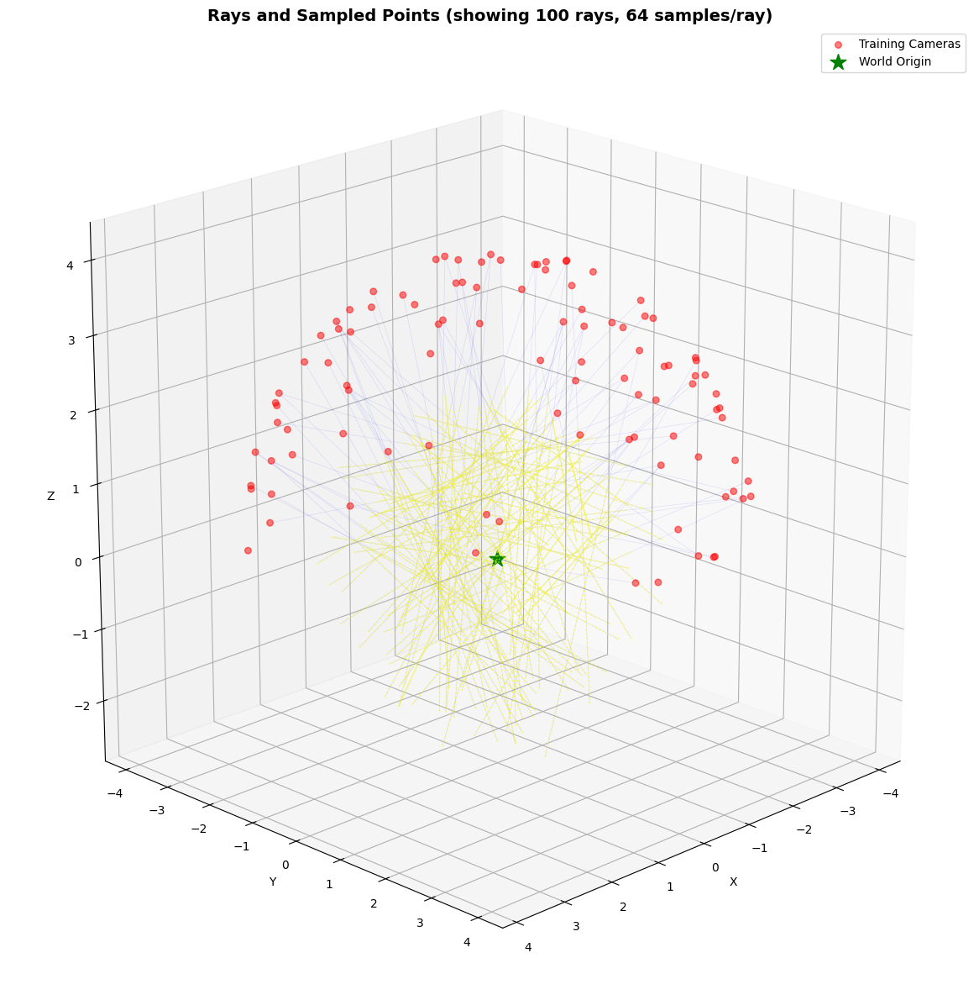

In [488]:
fig = plt.figure(figsize = (16, 12))
ax = fig.add_subplot(111, projection = '3d')

num_viz_rays = 100
rays_o_viz, rays_d_viz, _ = dataset.sample_rays(num_viz_rays)
pts_viz, z_vals_viz = sample_points_along_rays(rays_o_viz, rays_d_viz, near, far, n_samples, perturb = False)

rays_o_np = rays_o_viz.cpu().numpy()
rays_d_np = rays_d_viz.cpu().numpy()
pts_np = pts_viz.cpu().numpy()

camera_positions = c2ws_train[:, :3, 3]
ax.scatter(camera_positions[:, 0], camera_positions[:, 1], camera_positions[:, 2], c = 'red', marker = 'o', s = 30, alpha = 0.5, label = 'Training Cameras')


plot_every = max(1, num_viz_rays // 100)
for i in range(0, num_viz_rays, plot_every):
    ray_o = rays_o_np[i]
    ray_d = rays_d_np[i]
    samples = pts_np[i]
    ray_end = ray_o + ray_d * far
    ax.plot([ray_o[0], ray_end[0]], [ray_o[1], ray_end[1]], [ray_o[2], ray_end[2]], 'b-', alpha = 0.1, linewidth = 0.5)
    ax.scatter(samples[:, 0], samples[:, 1], samples[:, 2], c = 'yellow', marker = '.', s = 1, alpha = 0.5)

ax.scatter([0], [0], [0], c = 'green', marker = '*', s = 200, label = 'World Origin')

ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.set_title(f'Rays and Sampled Points (showing {num_viz_rays} rays, {n_samples} samples/ray)', fontsize = 14, fontweight = 'bold')
ax.legend()
ax.set_box_aspect([1, 1, 1])

ax.view_init(elev = 20, azim = 45)

plt.tight_layout()
plt.savefig('final_images/10_lego_rays_and_samples.png', dpi=150, bbox_inches='tight')
plt.show()


### Visualization 2: Training Progression

Show how the rendered images improve over training iterations.


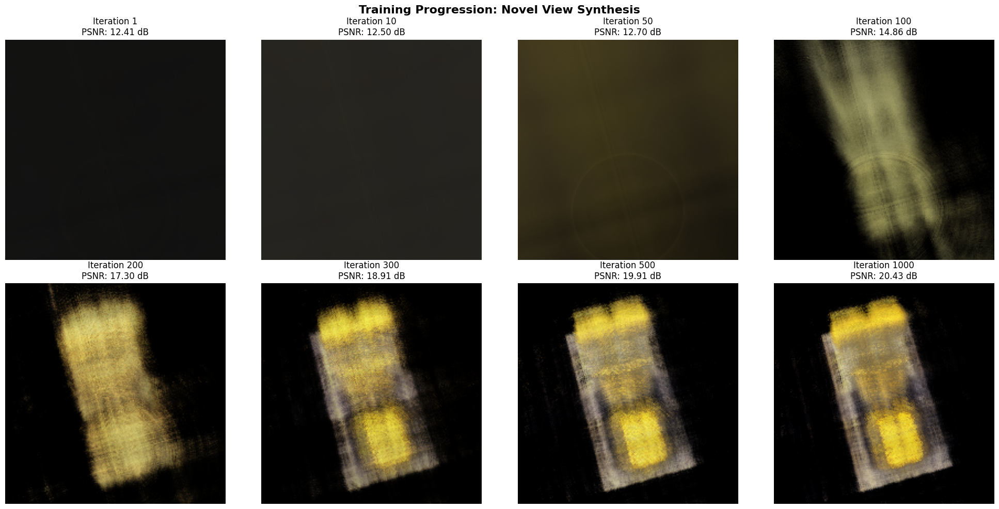

(viser) Connection closed (0, 0 total)

(viser) Connection opened (1, 1 total), 608 persistent messages

(viser) Connection closed (1, 0 total)

In [441]:
num_checkpoints = len(history["rendered_images"])

# Force 2 rows, 4 columns layout (8 total images)
cols = 4
rows = 2
fig, axes = plt.subplots(rows, cols, figsize = (5 * cols, 5 * rows))

axes = axes.flatten()
checkpoint_iters = val_checkpoints[: len(history["rendered_images"])]

# Display up to 8 images
for idx in range(min(8, len(history["rendered_images"]))):
    if idx < len(history["rendered_images"]) and history["rendered_images"][idx] is not None:
        img = history["rendered_images"][idx]
        iteration = checkpoint_iters[idx] if idx < len(checkpoint_iters) else val_checkpoints[idx] if idx < len(val_checkpoints) else "N/A"
        psnr = history["val_psnr"][idx] if idx < len(history["val_psnr"]) else 0.0
        axes[idx].imshow(np.clip(img, 0, 1))
        axes[idx].set_title(f"Iteration {iteration}\nPSNR: {psnr:.2f} dB", fontsize = 12)
    axes[idx].axis("off")

# Hide any remaining empty subplots
for idx in range(min(8, len(history["rendered_images"])), 8):
    axes[idx].axis("off")

plt.suptitle("Training Progression: Novel View Synthesis", fontsize = 16, fontweight = "bold")
plt.tight_layout()
plt.savefig("final_images/11_lego_training_progression.png", dpi=150, bbox_inches="tight")
plt.show()


### Visualization 3: PSNR Curve on Validation Set

Plot how the PSNR metric improves during training.


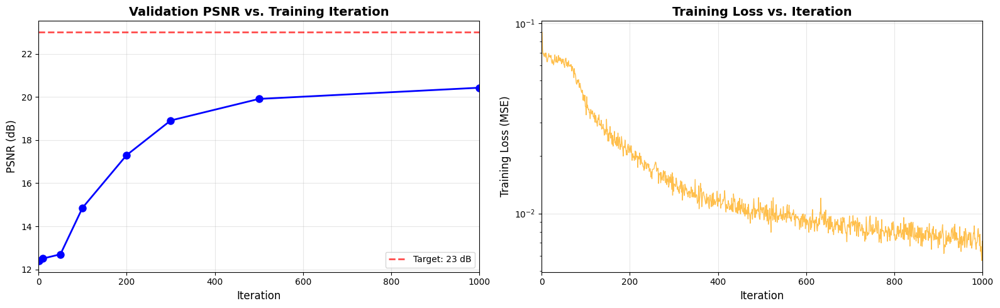

In [438]:

fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (16, 5))

val_iters_full = history.get('val_iterations', [])
checkpoint_iters = val_iters_full if val_iters_full else val_checkpoints

num_psnr = min(len(checkpoint_iters), len(history['val_psnr']))

checkpoint_iters = checkpoint_iters[:num_psnr]
psnr_values = history['val_psnr'][:num_psnr]

ax1.plot(checkpoint_iters, psnr_values, 'o-', linewidth = 2, markersize = 8, color = 'blue')
ax1.set_xlabel('Iteration', fontsize = 12)
ax1.set_ylabel('PSNR (dB)', fontsize = 12)
ax1.set_title('Validation PSNR vs. Training Iteration', fontsize = 14, fontweight = 'bold')
ax1.grid(True, alpha = 0.3)
ax1.set_xlim(0, num_iterations)
ax1.axhline(y = 23.0, color = 'red', linestyle = '--', linewidth = 2, alpha = 0.7, label = 'Target: 23 dB')
ax1.legend(fontsize = 10)

ax2.plot(history['iterations'], history['train_loss'], linewidth = 1, alpha = 0.7, color = 'orange')
ax2.set_xlabel('Iteration', fontsize = 12)
ax2.set_ylabel('Training Loss (MSE)', fontsize = 12)
ax2.set_title('Training Loss vs. Iteration', fontsize = 14, fontweight = 'bold')
ax2.grid(True, alpha = 0.3)
ax2.set_xlim(0, num_iterations)
ax2.set_yscale('log')

plt.tight_layout()
plt.savefig('final_images/12_lego_psnr_curve.png', dpi=150, bbox_inches='tight')
plt.show()



### Visualization 4: Spherical Rendering Video

Create a video by rendering novel views from the test camera trajectory.


In [188]:
!pip install imageio-ffmpeg

python(39773) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


In [396]:
import imageio
from tqdm import tqdm

test_frames = []

for i in tqdm(range(len(c2ws_test)), desc = "Rendering frames"):

    frame = render_image(
        nerf, K_train, c2ws_test[i], H, W,
        near, far, n_samples, chunk_size = 2048, device = device
    )

    frame_uint8 = (np.clip(frame, 0, 1) * 255).astype(np.uint8)
    test_frames.append(frame_uint8)

video_path = 'nerf_lego_spherical.mp4'
try:
    imageio.mimsave(video_path, test_frames, fps = 30, format = 'FFMPEG', codec = 'libx264')

except TypeError:
    imageio.mimsave(video_path, test_frames, fps = 30)

gif_path = 'nerf_lego_spherical.gif'
imageio.mimsave(gif_path, test_frames[::2], duration = 1 / 15, loop = 0)

Rendering frames: 100%|██████████| 60/60 [01:56<00:00,  1.94s/it]
IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (200, 200) to (208, 208) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).
python(90870) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


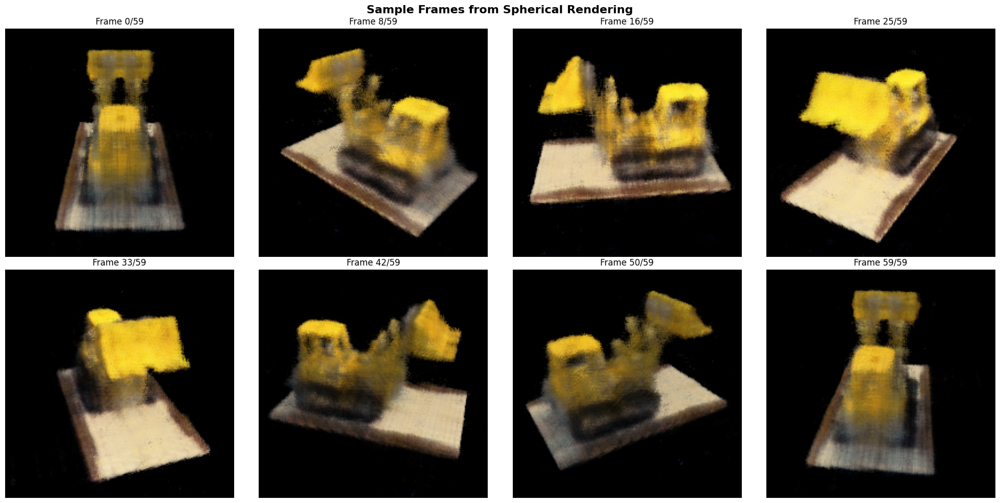

In [433]:

fig, axes = plt.subplots(2, 4, figsize = (20, 10))

axes = axes.flatten()
frame_indices = np.linspace(0, len(test_frames) - 1, 8, dtype = int)

for idx, frame_idx in enumerate(frame_indices):
    axes[idx].imshow(test_frames[frame_idx])
    axes[idx].set_title(f'Frame {frame_idx}/{len(test_frames) - 1}', fontsize = 12)
    axes[idx].axis('off')

plt.suptitle('Sample Frames from Spherical Rendering', fontsize = 16, fontweight = 'bold')

plt.tight_layout()
plt.savefig('final_images/13_lego_spherical_frames.png', dpi=150, bbox_inches='tight')
plt.show()



## Part 2.6: Custom NeRF Training

Train a NeRF on the real-world dataset captured in Part 0 (cup scene).


In [398]:
cup_data = np.load('cup_dataset.npz')

images_train_cup = cup_data['images_train'] / 255.0
images_val_cup = cup_data['images_val'] / 255.0
c2ws_train_cup = cup_data['c2ws_train']
c2ws_val_cup = cup_data['c2ws_val']
c2ws_test_cup = cup_data['c2ws_test']
focal_cup = float(cup_data['focal'])

H_cup, W_cup = images_train_cup.shape[1:3]
K_cup = create_intrinsic_matrix(focal_cup, W_cup, H_cup)

In [399]:
cup_dataset = RaysDataset(images_train_cup, K_cup.numpy(), c2ws_train_cup, device=device)

In [ ]:
def train_custom_nerf(
    dataset,
    nerf_model,
    images_val,
    c2ws_val,
    K,
    near,
    far,
    n_samples = 64,
    num_iterations = 1000,
    batch_size = 1000,
    val_checkpoints = None,
    log_every = 50,
    chunk_size = 4096,
    max_val_images = 3,
    tag = "cup",
    lr = 5e-4,
):

    if val_checkpoints is None:
        val_checkpoints = [100, 200, 300, 400, 600]

    history = {
        "iterations": [],
        "train_loss": [],
        "val_psnr": [],
        "val_iterations": [],
        "rendered_images": [],
    }

    nerf_model.train()

    optimizer = optim.Adam(nerf_model.parameters(), lr = lr)

    start_time = time.time()
    
    print(f"\n{'='*70}")
    print(f"Starting training ({tag.upper()})")
    print(f"{'='*70}")
    print(f"Total iterations: {num_iterations}")
    print(f"Batch size: {batch_size}")
    print(f"Learning rate: {lr}")
    print(f"Log every: {log_every} iterations")
    print(f"Validation checkpoints: {val_checkpoints}")
    print(f"{'='*70}\n")

    for iteration in range(1, num_iterations + 1):

        nerf_model.train()

        rays_o, rays_d, rgb_gt = dataset.sample_rays(batch_size)
        pts, _ = sample_points_along_rays(rays_o, rays_d, near, far, n_samples, perturb = True)
        dirs = rays_d[:, None, :].expand_as(pts)
        pts_flat = pts.reshape(-1, 3)
        dirs_flat = dirs.reshape(-1, 3)
        density, rgb = nerf_model(pts_flat, dirs_flat)
        density = density.reshape(batch_size, n_samples, 1)
        rgb = rgb.reshape(batch_size, n_samples, 3)
        step_size = (far - near) / n_samples

        rendered = volrend(density, rgb, step_size)
        loss = torch.mean((rendered - rgb_gt) ** 2)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        history['iterations'].append(iteration)
        history['train_loss'].append(loss.item())

        if iteration % log_every == 0:
            elapsed = time.time() - start_time
            iter_per_sec = iteration / max(elapsed, 1e-6)
            eta_min = (num_iterations - iteration) / max(iter_per_sec, 1e-6) / 60
            eta_sec = (num_iterations - iteration) / max(iter_per_sec, 1e-6)
            
            elapsed_min = int(elapsed // 60)
            elapsed_sec = int(elapsed % 60)
            eta_min_int = int(eta_min)
            eta_sec_remaining = int(eta_sec % 60)
            
            print(f"Iter {iteration}/{num_iterations} | Loss: {loss.item():.6f} | "
                  f"Elapsed: {elapsed_min}m {elapsed_sec}s | "
                  f"ETA: {eta_min_int}m {eta_sec_remaining}s | "
                  f"Speed: {iter_per_sec:.2f} iter/s")

        if iteration in val_checkpoints:
            nerf_model.eval()
            val_psnrs = []
            captured_image = None

            with torch.no_grad():
                for val_idx in range(min(max_val_images, len(images_val))):
                    rendered_img = render_image(
                        nerf_model,
                        K,
                        c2ws_val[val_idx],
                        H_cup,
                        W_cup,
                        near,
                        far,
                        n_samples,
                        chunk_size = chunk_size,
                        device = device
                    )

                    gt_img = images_val[val_idx]
                    psnr = compute_psnr(rendered_img, gt_img)
                    val_psnrs.append(psnr)

                    if val_idx == 0:
                        captured_image = rendered_img

            avg_psnr = float(np.mean(val_psnrs)) if val_psnrs else float('nan')
            history['val_iterations'].append(iteration)
            history['val_psnr'].append(avg_psnr)
            history['rendered_images'].append(captured_image)
            elapsed = time.time() - start_time
            
            iter_per_sec = iteration / max(elapsed, 1e-6)
            eta_min = (num_iterations - iteration) / max(iter_per_sec, 1e-6) / 60
            eta_sec = (num_iterations - iteration) / max(iter_per_sec, 1e-6)
            
            elapsed_min = int(elapsed // 60)
            elapsed_sec = int(elapsed % 60)
            eta_min_int = int(eta_min)
            eta_sec_remaining = int(eta_sec % 60)
            
            print(f"\n[Validation Checkpoint] Iter {iteration}/{num_iterations} | "
                  f"Val PSNR: {avg_psnr:.2f} dB | "
                  f"Elapsed: {elapsed_min}m {elapsed_sec}s | "
                  f"ETA: {eta_min_int}m {eta_sec_remaining}s")
            print(f"{'='*70}\n")

    final_time = time.time() - start_time
    final_min = int(final_time // 60)
    final_sec = int(final_time % 60)
    
    print(f"\n{'='*70}")
    print(f"Training completed ({tag.upper()})")
    print(f"{'='*70}")
    print(f"Total time: {final_min}m {final_sec}s ({final_time:.2f} seconds)")
    print(f"Final iteration: {num_iterations}")
    if history['val_psnr']:
        print(f"Final validation PSNR: {history['val_psnr'][-1]:.2f} dB")
    print(f"{'='*70}\n")
    
    artifacts_dir = "artifacts"
    os.makedirs(artifacts_dir, exist_ok = True)
    tag_prefix = f"nerf_{tag.lower()}"

    payload = {
        "timestamp": datetime.now().isoformat(timespec = "seconds"),
        "config": {
            "iterations": num_iterations,
            "batch_size": batch_size,
            "learning_rate": lr,
            "near": near,
            "far": far,
            "n_samples": n_samples,
            "val_checkpoints": val_checkpoints,
            "log_every": log_every,
        },
        "history": history,
        "model_state_dict": {k: v.detach().cpu() for k, v in nerf_model.state_dict().items()},
    }

    torch.save(payload, os.path.join(artifacts_dir, f"{tag_prefix}_results.pt"))

    with open(os.path.join(artifacts_dir, f"{tag_prefix}_summary.json"), "w") as f:
        json.dump({
            "timestamp": payload["timestamp"],
            "final_psnr": history['val_psnr'][-1] if history['val_psnr'] else None,
            "iterations": history['iterations'][-1] if history['iterations'] else None,
            "results_file": f"{tag_prefix}_results.pt",
        }, f, indent = 2)

    return history


In [457]:
near_cup = 0.5
far_cup = 2
n_samples_cup = 64
batch_size_cup = 1000
num_iterations_cup = 500
val_checkpoints_cup = [100, 200, 300, 400, 500]
learning_rate_cup = 5e-4

nerf_cup = NeRF().to(device)
history_cup = train_custom_nerf(
    dataset=cup_dataset,
    nerf_model=nerf_cup,
    images_val=images_val_cup,
    c2ws_val=c2ws_val_cup,
    K=K_cup,
    near=near_cup,
    far=far_cup,
    n_samples=n_samples_cup,
    num_iterations=num_iterations_cup,
    batch_size=batch_size_cup,
    val_checkpoints=val_checkpoints_cup,
    log_every=50,
    chunk_size=4096,
    max_val_images=3,
    tag="cup", 
    lr=learning_rate_cup,
)

### Cup Scene: Rays and Samples

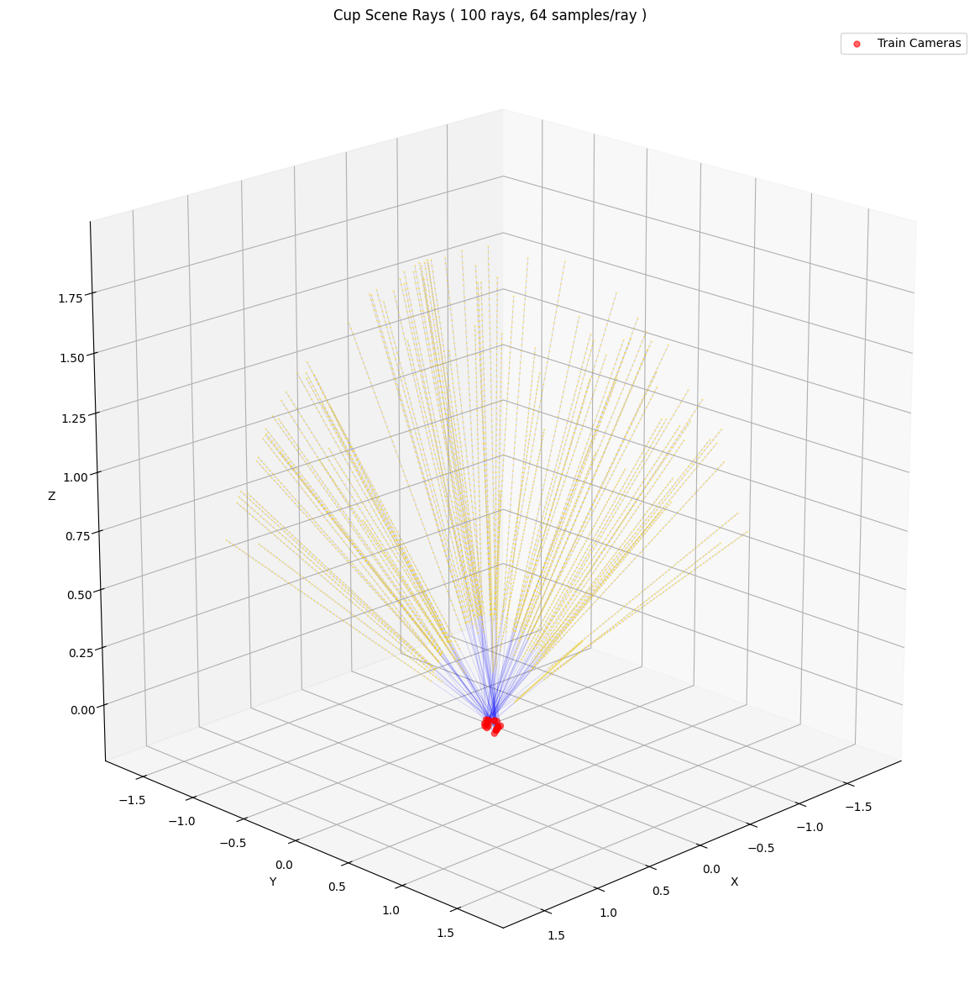

In [458]:

fig = plt.figure(figsize = (16, 12))
ax = fig.add_subplot(111, projection = '3d')

num_viz_rays_cup = 100

rays_o_cup, rays_d_cup, _ = cup_dataset.sample_rays(num_viz_rays_cup)
pts_cup, _ = sample_points_along_rays(rays_o_cup, rays_d_cup, near_cup, far_cup, n_samples_cup, perturb = False)

rays_o_np = rays_o_cup.cpu().numpy()
rays_d_np = rays_d_cup.cpu().numpy()
pts_np = pts_cup.cpu().numpy()

camera_positions_cup = c2ws_train_cup[:, :3, 3]

ax.scatter(
    camera_positions_cup[:, 0],
    camera_positions_cup[:, 1],
    camera_positions_cup[:, 2],
    c = 'red',
    marker = 'o',
    s = 25,
    alpha = 0.6,
    label = 'Train Cameras'
)

for i in range( num_viz_rays_cup ):

    ray_o = rays_o_np[i]
    ray_d = rays_d_np[i]
    samples = pts_np[i]
    ray_end = ray_o + ray_d * far_cup

    ax.plot(
        [ray_o[0], ray_end[0]],
        [ray_o[1], ray_end[1]],
        [ray_o[2], ray_end[2]],
        'b-',
        alpha = 0.15,
        linewidth = 0.6
    )

    ax.scatter(
        samples[:, 0],
        samples[:, 1],
        samples[:, 2],
        c = 'gold',
        marker = '.',
        s = 2,
        alpha = 0.4
    )

ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.set_title(f'Cup Scene Rays ( {num_viz_rays_cup} rays, {n_samples_cup} samples/ray )')
ax.legend()
ax.set_box_aspect([1, 1, 1])
ax.view_init(elev = 20, azim = 45)

plt.tight_layout()
plt.savefig('final_images/14_cup_rays_and_samples.png', dpi=150, bbox_inches='tight')
plt.show()

### Cup Scene: Training Loss and PSNR


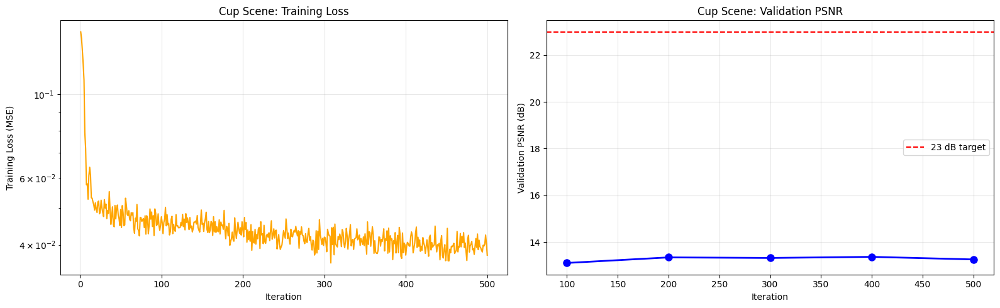

In [459]:
fig, (ax_loss, ax_psnr) = plt.subplots(1, 2, figsize = (16, 5))

ax_loss.plot(history_cup['iterations'], history_cup['train_loss'], color = 'orange', linewidth = 1.5)

ax_loss.set_xlabel('Iteration')
ax_loss.set_ylabel('Training Loss (MSE)')
ax_loss.set_title('Cup Scene: Training Loss')
ax_loss.grid(True, alpha = 0.3)
ax_loss.set_yscale('log')

val_iters_plot = history_cup['val_iterations'] if history_cup['val_iterations'] else val_checkpoints_cup[:len(history_cup['val_psnr'])]

ax_psnr.plot(val_iters_plot, history_cup['val_psnr'], 'o-', color = 'blue', linewidth = 2, markersize = 8)
ax_psnr.axhline(23.0, color = 'red', linestyle = '--', linewidth = 1.5, label = '23 dB target')
ax_psnr.set_xlabel('Iteration')
ax_psnr.set_ylabel('Validation PSNR (dB)')
ax_psnr.set_title('Cup Scene: Validation PSNR')
ax_psnr.grid(True, alpha = 0.3)
ax_psnr.legend()

plt.tight_layout()
plt.savefig('final_images/15_cup_training_loss_psnr.png', dpi=150, bbox_inches='tight')
plt.show()


### Cup Scene: Intermediate Validation Renders


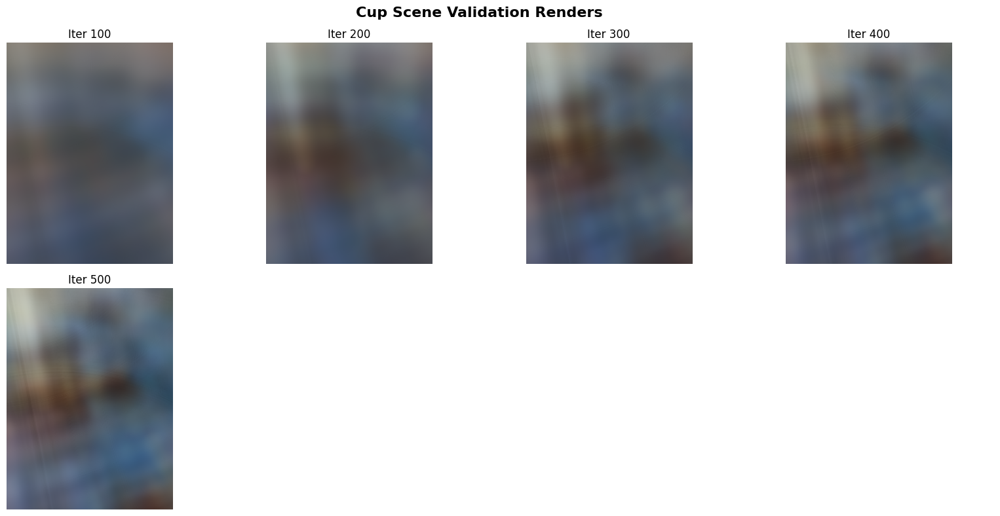

Displayed 5 validation checkpoints: [100, 200, 300, 400, 500]


In [460]:
val_iters_plot = history_cup['val_iterations'] if history_cup['val_iterations'] else val_checkpoints_cup[:len(history_cup['rendered_images'])]
num_images = len(history_cup['rendered_images'])
cols = min(4, num_images)
rows = (num_images + cols - 1) // cols

fig, axes = plt.subplots(rows, cols, figsize=(4*cols, 4*rows))
axes = np.atleast_2d(axes)
axes = axes.flatten()

for idx in range(num_images):
    img = history_cup['rendered_images'][idx]
    iteration = val_iters_plot[idx] if idx < len(val_iters_plot) else "N/A"
    if img is not None:
        axes[idx].imshow(np.clip(img, 0, 1))
        axes[idx].set_title(f"Iter {iteration}")
    else:
        axes[idx].text(0.5, 0.5, "No image", ha='center', va='center')
    axes[idx].axis('off')

for idx in range(num_images, len(axes)):
    axes[idx].axis('off')

plt.suptitle('Cup Scene Validation Renders', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.savefig('final_images/16_cup_intermediate_renders.png', dpi=150, bbox_inches='tight')
plt.show()

print(f"Displayed {num_images} validation checkpoints: {val_iters_plot}")


In [461]:
def look_at_origin(pos):
    pos = np.asarray(pos, dtype=np.float32)
    forward = -pos / np.linalg.norm(pos)
    up = np.array([0, 1, 0], dtype=np.float32)
    right = np.cross(up, forward)
    right = right / np.linalg.norm(right)
    up = np.cross(forward, right)

    c2w = np.eye(4, dtype=np.float32)
    c2w[:3, 0] = right
    c2w[:3, 1] = up
    c2w[:3, 2] = forward
    c2w[:3, 3] = pos
    return c2w

def rot_x(phi):
    return np.array([
        [math.cos(phi), -math.sin(phi), 0, 0],
        [math.sin(phi), math.cos(phi), 0, 0],
        [0, 0, 1, 0],
        [0, 0, 0, 1],
    ], dtype=np.float32)

In [462]:
import math
START_POS_CUP = c2ws_train_cup[0, :3, 3]
NUM_SAMPLES_CUP = 60

cup_frames = []
for phi_deg in np.linspace(0.0, 360.0, NUM_SAMPLES_CUP, endpoint=False):
    phi_rad = np.deg2rad(phi_deg)
    base_c2w = look_at_origin(START_POS_CUP)
    extrinsic = rot_x(phi_rad) @ base_c2w

    frame = render_image(
        nerf_cup,
        K_cup,
        extrinsic,
        H_cup,
        W_cup,
        near_cup,
        far_cup,
        n_samples_cup,
        chunk_size=4096,
        device=device
    )
    cup_frames.append(np.clip(frame, 0, 1))

In [463]:
cup_video_path = 'cup_scene.mp4'

cup_gif_path = 'cup_scene.gif'
import imageio_ffmpeg

if has_ffmpeg:
    try:
        imageio.mimsave(
            cup_video_path,
            [(frame * 255).astype(np.uint8) for frame in cup_frames],
            fps = 24,
            format = 'FFMPEG',
            codec = 'libx264'
        )
    except Exception as e:
        pass

imageio.mimsave(
    cup_gif_path,
    [(frame * 255).astype(np.uint8) for frame in cup_frames],
    duration = 1 / 15,
    loop = 0
)


python(84864) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


### Cup Scene: Sample Frames


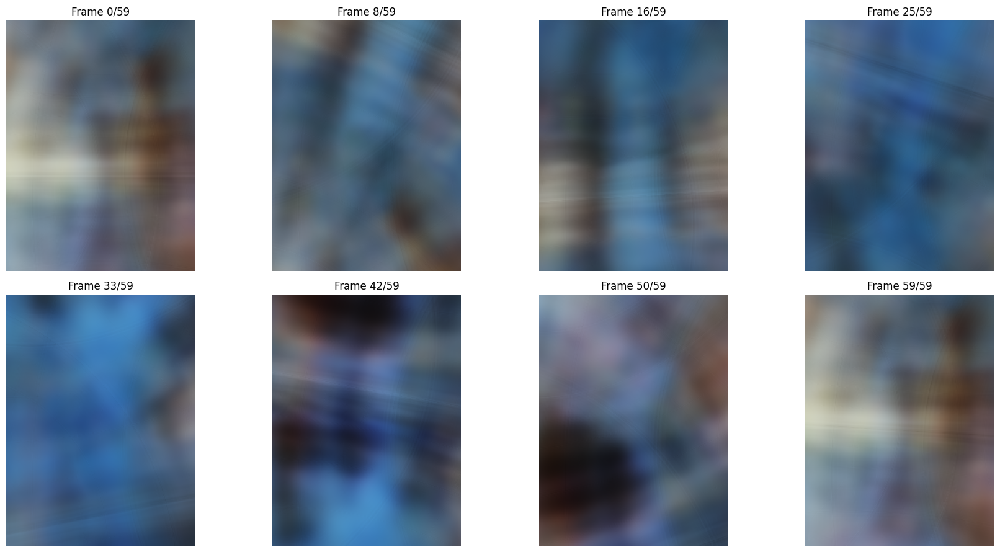

In [464]:
fig, axes = plt.subplots(2, 4, figsize=(18, 9))
axes = axes.flatten()
frame_indices = np.linspace(0, len(cup_frames) - 1, 8, dtype=int)

for ax, idx in zip(axes, frame_indices):
    ax.imshow(cup_frames[idx])
    ax.set_title(f"Frame {idx}/{len(cup_frames)-1}")
    ax.axis('off')

plt.tight_layout()
plt.savefig('final_images/17_cup_scene_frames.png', dpi=150, bbox_inches='tight')
plt.show()
